## Connect to Google Drive

In [ ]:
from google.colab import drive
drive.mount('/content/drive')

Mounted at /content/drive


## Model Development Section

In [ ]:
import torch

print("Is CUDA available? ", torch.cuda.is_available())
print("CUDA device count: ", torch.cuda.device_count())
print("Current device: ", torch.cuda.current_device())
print("Device name: ", torch.cuda.get_device_name(0))


Is CUDA available?  True
CUDA device count:  1
Current device:  0
Device name:  Tesla T4


In [ ]:
device = torch.device("cuda" if torch.cuda.is_available() else "cpu")
print(device)

cuda


Import required Libraries

In [ ]:
import torch
import torch.nn as nn
import torch.nn.functional as F
import torch.optim as optim
from torch.utils.data import DataLoader
from torch.cuda.amp import autocast, GradScaler
from torch import amp
from tqdm import tqdm
import torchvision.models as models
from PIL import Image
from torchvision import transforms
from torchvision.models import vgg19, VGG19_Weights
from torch.utils.data import Dataset, DataLoader
import matplotlib.pyplot as plt
from IPython.display import clear_output
import os
import csv

Apply preprocessing and data augmentation

Processing images from: /content/drive/MyDrive/OUR_DTGAN_MODEL/dataset/train_photo: 100%|██████████| 6656/6656 [00:02<00:00, 2466.26it/s]


Real Images are saved in /content/drive/MyDrive/OUR_DTGAN_MODEL/real_world_processed_images after preprocessing.


Processing images from: /content/drive/MyDrive/OUR_DTGAN_MODEL/dataset/Shinkai/style: 100%|██████████| 1650/1650 [00:00<00:00, 2834.75it/s]


Anime Images are saved in /content/drive/MyDrive/OUR_DTGAN_MODEL/Anime_processed_data after preprocessing.


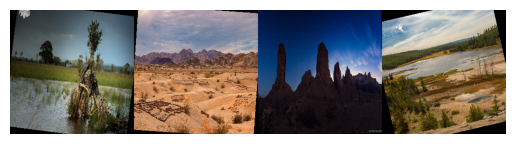

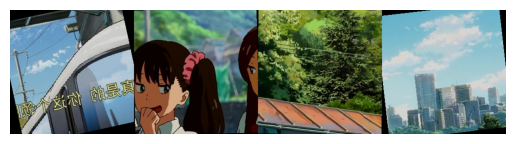

In [ ]:
# Enhanced transformation steps
transform = transforms.Compose([
    transforms.Resize((256, 256)),                       # Resize to 256x256 pixels
    transforms.RandomHorizontalFlip(p=0.5),              # Random horizontal flip with 50% probability
    transforms.RandomRotation(15),                       # Random rotation by ±15 degrees
    transforms.RandomVerticalFlip(p=0.2),                # Random vertical flip with 20% probability
    transforms.ColorJitter(brightness=0.2,               # Random brightness adjustment
                           contrast=0.2,                 # Random contrast adjustment
                           saturation=0.2,               # Random saturation adjustment
                           hue=0.1),                     # Random hue adjustment
    transforms.RandomAffine(degrees=0,                   # Random affine transformation with translation
                            translate=(0.1, 0.1),        # Up to 10% translation in both x and y directions
                            scale=(0.9, 1.1),            # Random scaling between 90% and 110%
                            shear=10),                   # Random shear up to 10 degrees
    transforms.RandomPerspective(distortion_scale=0.5,   # Random perspective distortion
                                 p=0.5,                  # Apply with 50% probability
                                 interpolation=3),       # Use bicubic interpolation
    transforms.ToTensor(),                               # Convert to tensor
    transforms.Normalize(mean=(0.5, 0.5, 0.5), std=(0.5, 0.5, 0.5))  # Normalize to [-1, 1]
])


# Paths for original and processed images
real_world_dir = our_model_directory_path + "dataset/train_photo"      # Original images
anime_style_dir = our_model_directory_path + "dataset/Shinkai/style"   # Original anime images

processed_real_dir = our_model_directory_path + "real_world_processed_images" # Preprocessed real-world images
processed_anime_dir = our_model_directory_path + "Anime_processed_data"       # Preprocessed anime images

# Ensure processed directories exist
os.makedirs(processed_real_dir, exist_ok=True)
os.makedirs(processed_anime_dir, exist_ok=True)

# Function to preprocess and save images if not already done
def preprocess_and_save_images(input_dir, output_dir, transform):
    for img_name in tqdm(os.listdir(input_dir), desc=f"Processing images from: {input_dir}"):
        img_path = os.path.join(input_dir, img_name)
        output_path = os.path.join(output_dir, img_name.replace('.jpg', '.pt'))  # Save as .pt file

        # Skip processing if the file is already saved
        if os.path.exists(output_path):
            continue

        # Load, transform, and save the image as a tensor
        image = Image.open(img_path).convert("RGB")
        transformed_image = transform(image)
        torch.save(transformed_image, output_path)

# Run this once to preprocess and save images
preprocess_and_save_images(real_world_dir, processed_real_dir, transform)
print(f"Real Images are saved in {processed_real_dir} after preprocessing.")

preprocess_and_save_images(anime_style_dir, processed_anime_dir, transform)
print(f"Anime Images are saved in {processed_anime_dir} after preprocessing.")

# Custom Dataset Class to load preprocessed images
class PreprocessedImageDataset(Dataset):
    def __init__(self, processed_dir):
        self.processed_dir = processed_dir
        self.image_files = [f for f in os.listdir(processed_dir) if f.endswith('.pt')]

    def __len__(self):
        return len(self.image_files)

    def __getitem__(self, idx):
        img_path = os.path.join(self.processed_dir, self.image_files[idx])
        image = torch.load(img_path, weights_only=True)  # Set weights_only=True to suppress the warning
        return image

# Create dataset instances using preprocessed images
real_world_dataset = PreprocessedImageDataset(processed_dir=processed_real_dir)
anime_style_dataset = PreprocessedImageDataset(processed_dir=processed_anime_dir)

# DataLoader for batch processing
batch_size = 8
real_world_loader = DataLoader(real_world_dataset, batch_size=batch_size, shuffle=True, num_workers=2)
anime_style_loader = DataLoader(anime_style_dataset, batch_size=batch_size, shuffle=True, num_workers=2)

# Example to display a batch
def show_batch(images):
    images = images * 0.5 + 0.5  # Unnormalize to [0, 1] for display
    grid = torch.cat([images[i] for i in range(min(4, len(images)))], dim=2)  # Display up to 4 images side by side
    plt.imshow(grid.permute(1, 2, 0))  # Reorder dimensions for display
    plt.axis('off')
    plt.show()

# Display a batch of real-world images
real_images_batch = next(iter(real_world_loader))
show_batch(real_images_batch)

# Display a batch of anime-style images
anime_images_batch = next(iter(anime_style_loader))
show_batch(anime_images_batch)


Content and Style Loss Functions

In [ ]:
# Automatic device selection
device = torch.device("cuda" if torch.cuda.is_available() else "cpu")
print(f"Using device: {device}")

# Path for the VGG19 model in Google Drive
vgg19_path = our_model_directory_path + 'vgg19_model.pth'

# Function to save the VGG19 model
def save_vgg19_to_drive(model, path):
    torch.save(model.state_dict(), path)
    print(f"✅ VGG19 model saved to {path}")


def initialize_weights(m):
    if isinstance(m, nn.Conv2d):
        torch.nn.init.kaiming_normal_(m.weight, mode='fan_out', nonlinearity='relu')
        if m.bias is not None:
            torch.nn.init.constant_(m.bias, 0)

# Load VGG19 model (from Google Drive or download if needed)
def load_vgg19():
    if os.path.exists(vgg19_path):
        print("✅ VGG19 model found in Google Drive. Loading...")
        model = models.vgg19(weights=None).features.to(device).eval()
        model.load_state_dict(torch.load(vgg19_path, map_location=device))
    else:
        print("❌ VGG19 model not found. Downloading...")
        model = models.vgg19(weights=models.VGG19_Weights.DEFAULT).features.to(device).eval()
        save_vgg19_to_drive(model, vgg19_path)

    # Apply weight initialization after loading the model
    model.apply(initialize_weights)

    return model

# Load the VGG19 model
vgg = load_vgg19()
print("✅ VGG19 model is ready for feature extraction.")



vgg.apply(initialize_weights)
print("✅ VGG19 weights initialized.")

# Feature extraction helper
def get_features(image, model, layers=None):
    if layers is None:
        layers = {
            '0': 'conv1_1',
            '5': 'conv2_1',
            '10': 'conv3_1',
            '19': 'conv4_1',
            '21': 'conv4_2'
        }

    features = {}
    x = image.to(device)

    for name, layer in model._modules.items():
        x = layer(x) if not isinstance(layer, nn.ReLU) else F.relu(x, inplace=False)
        if name in layers:
            features[layers[name]] = x.detach()

    return features


# Content Loss Calculation
def content_loss(content_features, generated_features, layer="conv4_2", weight=1.0):
    """
    Computes mean squared error (MSE) between content and generated features.
    :param content_features: Extracted features of content image
    :param generated_features: Extracted features of generated image
    :param layer: Layer used for content loss
    :param weight: Scaling factor for loss
    :return: Content loss value
    """
    if str(layer) not in content_features:
      print(f"❌ Layer {layer} not found! Available layers: {list(content_features.keys())}")
      return torch.tensor(0.0, device=device)

    content = content_features[str(layer)].to(device)
    generated = generated_features[str(layer)].to(device)

    return F.mse_loss(generated, content) * weight

# Optimized Gram Matrix Calculation
def gram_matrix(tensor):
    """
    Compute Gram matrix for style loss with batch support.
    :param tensor: Feature tensor (B, C, H, W)
    :return: Normalized Gram matrix
    """
    b, c, h, w = tensor.size()
    tensor = tensor.view(b, c, h * w)  # Flatten spatial dimensions
    gram = torch.bmm(tensor, tensor.transpose(1, 2))  # Batch matrix multiplication
    return gram / (c * h * w)  # Normalize

def safe_mse_loss(x, y):
    if torch.isnan(x).any() or torch.isnan(y).any():
        print("⚠️ NaN detected in MSE Loss computation! Skipping this layer.")
        return torch.tensor(0.0, device=device)
    return F.mse_loss(x, y)

def style_loss(style_features, generated_features, style_weight=1e2, layers=None):
    if layers is None:
        if isinstance(style_features, dict):
            layers = style_features.keys()
        else:
            raise TypeError("style_features should be a dictionary of features.")

    total_style_loss = 0
    for layer in layers:
        style = style_features[layer].to(device)
        generated = generated_features[layer].to(device)

        if style.numel() == 0 or generated.numel() == 0:
            print(f"⚠️ Empty tensor detected in {layer}. Skipping this layer.")
            continue

        gram_style = gram_matrix(style)
        # print(f"Gram Style: {gram_style}")
        gram_generated = gram_matrix(generated)
        # print(f"Gram Generated: {gram_generated}")

        total_style_loss += safe_mse_loss(gram_generated, gram_style)
        print(f"Total Style Loss: {total_style_loss}")

    return total_style_loss * style_weight



Using device: cuda
✅ VGG19 model found in Google Drive. Loading...
✅ VGG19 model is ready for feature extraction.
✅ VGG19 weights initialized.


Verifying the feature extraction

In [ ]:
anime_images_batch = next(iter(anime_style_loader))

# Select the first image in the batch
anime_image = anime_images_batch[0].unsqueeze(0).to(device)  # Add batch dimension
print(f"✅ Loaded real-world image for feature extraction. Shape: {anime_image.shape}")

✅ Loaded real-world image for feature extraction. Shape: torch.Size([1, 3, 256, 256])


In [ ]:
# Get a batch of preprocessed real-world images
real_images_batch = next(iter(real_world_loader))  # Fetch one batch

# Select the first image in the batch
real_image = real_images_batch[0].unsqueeze(0).to(device)  # Add batch dimension
print(f"✅ Loaded real-world image for feature extraction. Shape: {real_image.shape}")


✅ Loaded real-world image for feature extraction. Shape: torch.Size([1, 3, 256, 256])


📢 Layer: conv1_1, Shape: torch.Size([1, 64, 256, 256])


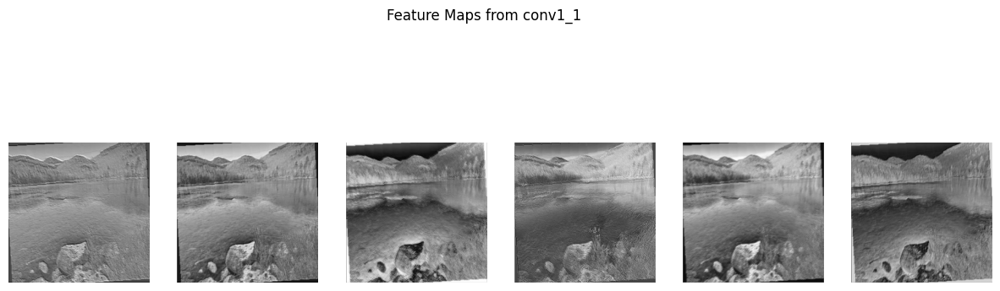

📢 Layer: conv2_1, Shape: torch.Size([1, 128, 128, 128])


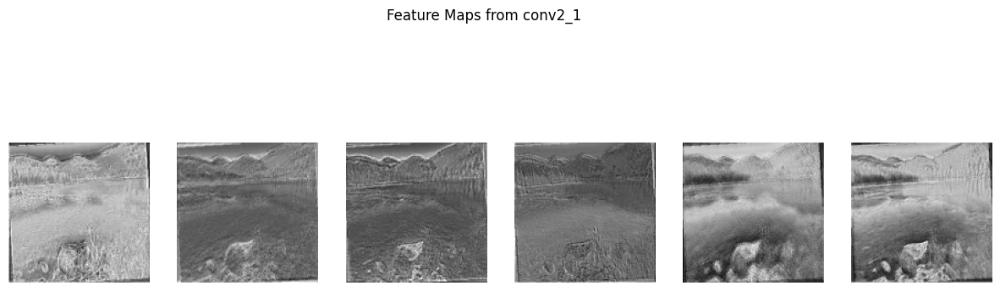

📢 Layer: conv3_1, Shape: torch.Size([1, 256, 64, 64])


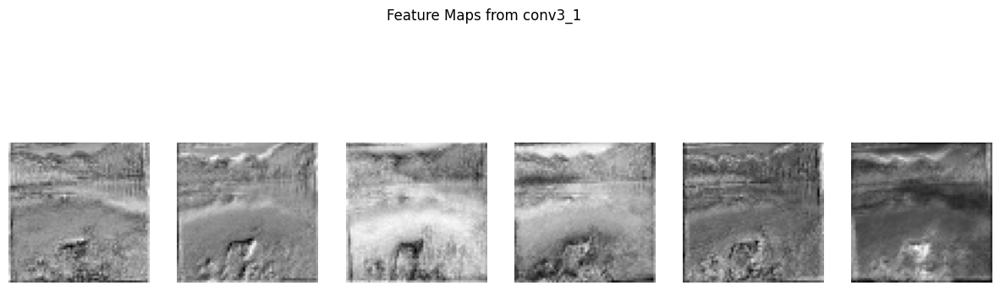

📢 Layer: conv4_1, Shape: torch.Size([1, 512, 32, 32])


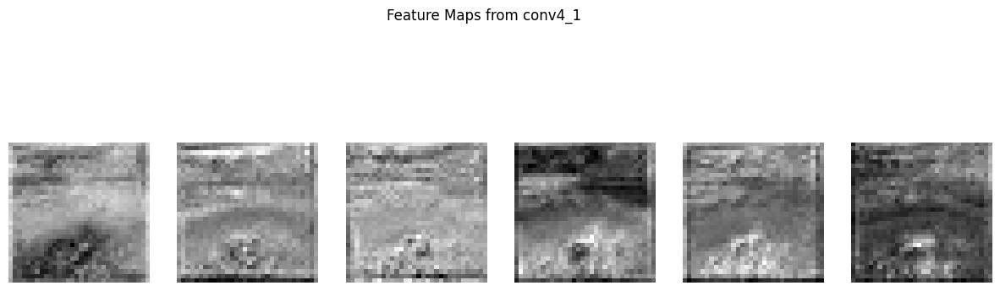

📢 Layer: conv4_2, Shape: torch.Size([1, 512, 32, 32])


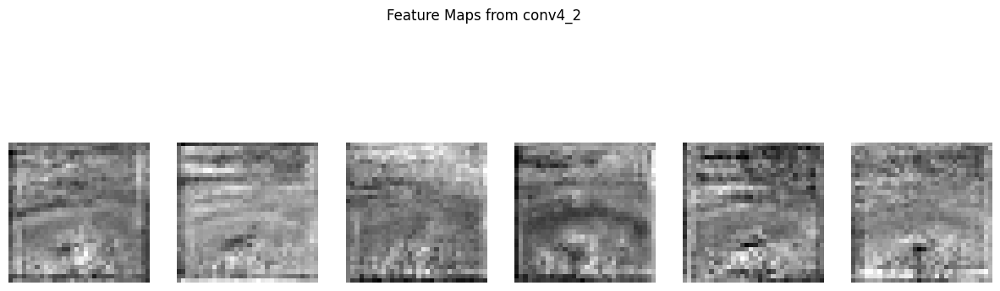

In [ ]:
def visualize_real_feature_maps(image, model, layers=None):
    """Extract and visualize feature maps from a real image"""
    features = get_features(image, model, layers)

    for layer_name, feature_map in features.items():
        print(f"📢 Layer: {layer_name}, Shape: {feature_map.shape}")  # Print feature map shape

        # Select the first feature map (channel)
        feature_map = feature_map[0].detach().cpu().numpy()

        # Plot the first 6 feature maps
        fig, axes = plt.subplots(1, 6, figsize=(15, 5))
        for i in range(6):
            if i < feature_map.shape[0]:  # Some layers have fewer channels
                axes[i].imshow(feature_map[i], cmap='gray')
                axes[i].axis('off')
        plt.suptitle(f"Feature Maps from {layer_name}")
        plt.show()

# Extract and visualize features from the real image
visualize_real_feature_maps(real_image, vgg)


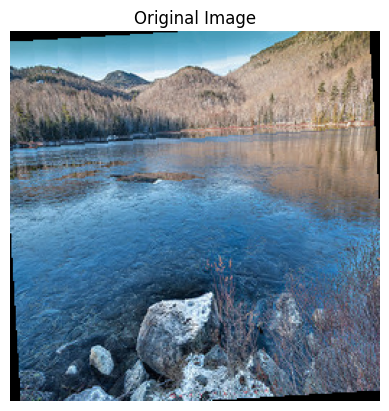

In [ ]:
# Display the original real-world image (unnormalized)
def show_image(image):
    image = image * 0.5 + 0.5  # Unnormalize to [0,1]
    plt.imshow(image.squeeze(0).permute(1, 2, 0).cpu())  # Convert back to image format
    plt.title("Original Image")
    plt.axis("off")
    plt.show()

# Show the original image
show_image(real_image)


In [ ]:
def check_feature_statistics(image, model, layers=None):
    """Computes mean and standard deviation of extracted features"""
    features = get_features(image, model, layers)

    for layer_name, feature_map in features.items():
        mean_val = feature_map.mean().item()
        std_val = feature_map.std().item()

        print(f"📊 Layer {layer_name} → Mean: {mean_val:.4f}, Std: {std_val:.4f}")

# Run statistical check
check_feature_statistics(real_image, vgg)


📊 Layer conv1_1 → Mean: 0.0008, Std: 0.1732
📊 Layer conv2_1 → Mean: -0.0070, Std: 0.1242
📊 Layer conv3_1 → Mean: 0.0061, Std: 0.0826
📊 Layer conv4_1 → Mean: 0.0012, Std: 0.0682
📊 Layer conv4_2 → Mean: -0.0034, Std: 0.0670


In [ ]:
def check_feature_sparsity(image, model, layers=None):
    """Checks how many elements in extracted features are non-zero"""
    features = get_features(image, model, layers)

    for layer_name, feature_map in features.items():
        nonzero_count = (feature_map != 0).sum().item()
        total_count = feature_map.numel()
        sparsity = 100 * (1 - nonzero_count / total_count)

        print(f"🔍 Layer {layer_name} → Non-Zero: {nonzero_count}/{total_count} ({100 - sparsity:.2f}% active)")

# Run sparsity check
check_feature_sparsity(real_image, vgg)


🔍 Layer conv1_1 → Non-Zero: 4194304/4194304 (100.00% active)
🔍 Layer conv2_1 → Non-Zero: 2097152/2097152 (100.00% active)
🔍 Layer conv3_1 → Non-Zero: 1048576/1048576 (100.00% active)
🔍 Layer conv4_1 → Non-Zero: 524288/524288 (100.00% active)
🔍 Layer conv4_2 → Non-Zero: 524288/524288 (100.00% active)


In [ ]:
from torch.nn.functional import cosine_similarity

def compare_feature_similarity(image1, image2, model, layer="conv4_2"):
    """Computes cosine similarity between extracted features of two images"""
    features1 = get_features(image1, model)
    features2 = get_features(image2, model)

    f1 = features1[layer].view(-1)  # Flatten
    f2 = features2[layer].view(-1)

    similarity = cosine_similarity(f1.unsqueeze(0), f2.unsqueeze(0)).item()
    print(f"🧩 Cosine Similarity at {layer}: {similarity:.4f}")

# Load another real-world image from dataset
real_images_batch_2 = next(iter(real_world_loader))

anime_images_batch_2 = next(iter(anime_style_loader))

real_image_2 = real_images_batch_2[0].unsqueeze(0).to(device)
anime_image_2 = anime_images_batch_2[0].unsqueeze(0).to(device)

# Compare extracted features
compare_feature_similarity(real_image, real_image_2, vgg)
compare_feature_similarity(real_image, anime_image_2, vgg)


🧩 Cosine Similarity at conv4_2: 0.8445
🧩 Cosine Similarity at conv4_2: 0.8126


In [ ]:
def check_feature_energy(image, model, layers=None):
    """Computes L2 norm of extracted features to measure energy"""
    features = get_features(image, model, layers)

    for layer_name, feature_map in features.items():
        energy = torch.norm(feature_map, p=2).item()  # Compute L2 norm
        print(f"⚡ Layer {layer_name} → Energy: {energy:.4f}")

# Run energy check
check_feature_energy(real_image, vgg)


⚡ Layer conv1_1 → Energy: 354.6580
⚡ Layer conv2_1 → Energy: 180.1789
⚡ Layer conv3_1 → Energy: 84.7883
⚡ Layer conv4_1 → Energy: 49.3668
⚡ Layer conv4_2 → Energy: 48.5791


Verifying the content and style loss

In [ ]:
def test_content_loss():
    content_img = torch.randn(1, 3, 256, 256).to(device)  # Random image (fake content)
    content_img = real_image
    generated_img = content_img.clone().detach()  # Start with same image

    content_features = get_features(content_img, vgg)
    generated_features = get_features(generated_img, vgg)

    loss_original = content_loss(content_features, generated_features)

    # Modify generated image slightly
    generated_img += torch.randn_like(generated_img) * 0.1
    generated_features = get_features(generated_img, vgg)

    loss_modified = content_loss(content_features, generated_features)

    print(f"Content Loss - Original: {loss_original.item()}, Modified: {loss_modified.item()}")

test_content_loss()


Content Loss - Original: 0.0, Modified: 0.00014199060387909412


In [ ]:
def test_style_loss():
    style_img = anime_image
    generated_img = style_img.clone().detach()  # Start with same image

    style_features = get_features(style_img, vgg)
    generated_features = get_features(generated_img, vgg)

    loss_original = style_loss(style_features, generated_features)

    # Modify generated image slightly
    generated_img += torch.randn_like(generated_img) * 0.1
    generated_features = get_features(generated_img, vgg)

    loss_modified = style_loss(style_features, generated_features)

    print(f"Style Loss - Original: {loss_original.item()}, Modified: {loss_modified.item()}")

test_style_loss()


Style Loss - Original: 0.0, Modified: 1.0755763923953054e-07


AdaIn and LADE

In [ ]:
# Define a Residual Block with instance normalization
class ResidualBlock(nn.Module):
    def __init__(self, channels):
        super(ResidualBlock, self).__init__()
        self.block = nn.Sequential(
            nn.Conv2d(channels, channels, kernel_size=3, stride=1, padding=1),
            nn.InstanceNorm2d(channels),
            nn.ReLU(inplace=True),
            nn.Conv2d(channels, channels, kernel_size=3, stride=1, padding=1),
            nn.InstanceNorm2d(channels)
        )

    def forward(self, x):
        return x + self.block(x)  # Skip connection for residual learning



class AdaIN(nn.Module):
    def __init__(self, style_scale=1.0, style_shift=0.0, epsilon=1e-5):
        super(AdaIN, self).__init__()
        self.style_scale = style_scale
        self.style_shift = style_shift
        self.epsilon = epsilon

    def forward(self, content, style):
        # Resize style to match content's spatial dimensions if necessary
        if style.size(2) != content.size(2) or style.size(3) != content.size(3):
            style = F.interpolate(style, size=(content.size(2), content.size(3)), mode='bilinear', align_corners=False)

        # Ensure channel dimensions match
        if style.size(1) != content.size(1):
            raise ValueError(f"Channel mismatch: content has {content.size(1)} channels, but style has {style.size(1)} channels.")

        # Calculate mean and std for content and style
        content_mean, content_std = self.calculate_mean_std(content)
        style_mean, style_std = self.calculate_mean_std(style)

        # Apply Adaptive Instance Normalization
        normalized_content = (content - content_mean) / (content_std + self.epsilon)
        stylized_content = normalized_content * (style_std * self.style_scale) + (style_mean + self.style_shift)

        # Clamp the values to avoid NaNs and extreme values
        stylized_content = torch.clamp(stylized_content, -1.0, 1.0)

        return stylized_content

    def calculate_mean_std(self, features):
        batch_size, channels = features.size(0), features.size(1)
        mean = features.view(batch_size, channels, -1).mean(2).view(batch_size, channels, 1, 1)
        std = features.view(batch_size, channels, -1).std(2).view(batch_size, channels, 1, 1) + self.epsilon
        return mean, std


class LADE(nn.Module):
    def __init__(self, in_channels=256, out_channels=256, num_layers=3):  # Update in_channels
        super(LADE, self).__init__()
        self.distillation_layers = nn.ModuleList([
            nn.Sequential(
                nn.Conv2d(in_channels, in_channels, kernel_size=3, padding=1),  # Update in_channels here
                nn.LeakyReLU(0.2, inplace=True),
                nn.Conv2d(in_channels, in_channels, kernel_size=3, padding=1),  # Update in_channels here
                nn.LeakyReLU(0.2, inplace=True)
            ) for i in range(num_layers)
        ])

        # Learnable weights for each layer for adaptive style transfer
        self.layer_weights = nn.ParameterList([nn.Parameter(torch.ones(1)) for _ in range(num_layers)])

    def forward(self, x):
        lade_output = x
        outputs = []

        # Apply multi-layered distillation with learnable weights
        for i, layer in enumerate(self.distillation_layers):
            lade_output = layer(lade_output)
            outputs.append(self.layer_weights[i] * lade_output)

        # Combine outputs from all layers
        lade_output = sum(outputs)

        # Clamp the final output to stabilize values
        lade_output = torch.clamp(lade_output, -1.0, 1.0)
        return lade_output


Verifying AdaIN and LADE

In [ ]:
import torch

# Create a dummy input tensor (Batch Size=1, Channels=256, Height=64, Width=64)
dummy_input = torch.randn(1, 256, 64, 64)
print(f"Random Dummy Input Shape Before: {dummy_input.shape}")

# Change the number of channels from 3 to 256 using a convolutional layer
# Define a simple Conv layer to change channels
conv = torch.nn.Conv2d(3, 256, kernel_size=1, stride=1, padding=0).to(device)

# Apply the convolution to change channels
dummy_input = conv(real_image)
print(f"Real Image Shape: {real_image.shape}")

print(f"Dummy Input Shape After: {dummy_input.shape}")

# Instantiate modules
res_block = ResidualBlock(256).to(device)
adain = AdaIN().to(device)
lade = LADE().to(device)

# Forward pass
res_output = res_block(dummy_input)
adain_output = adain(dummy_input, dummy_input)  # Using same input for content & style as a test
lade_output = lade(dummy_input)

# Check for NaNs or inf values
assert not torch.isnan(res_output).any(), "Residual Block produced NaN values!"
assert not torch.isnan(adain_output).any(), "AdaIN produced NaN values!"
assert not torch.isnan(lade_output).any(), "LADE produced NaN values!"
print("✅ No NaNs detected.")

# Check output shapes
print(f"Residual Block Output Shape: {res_output.shape}")
print(f"AdaIN Output Shape: {adain_output.shape}")
print(f"LADE Output Shape: {lade_output.shape}")


Random Dummy Input Shape Before: torch.Size([1, 256, 64, 64])
Real Image Shape: torch.Size([1, 3, 256, 256])
Dummy Input Shape After: torch.Size([1, 256, 256, 256])
✅ No NaNs detected.
Residual Block Output Shape: torch.Size([1, 256, 256, 256])
AdaIN Output Shape: torch.Size([1, 256, 256, 256])
LADE Output Shape: torch.Size([1, 256, 256, 256])


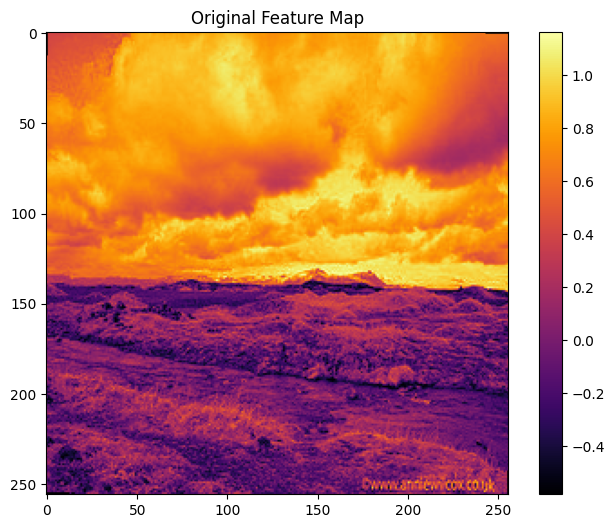

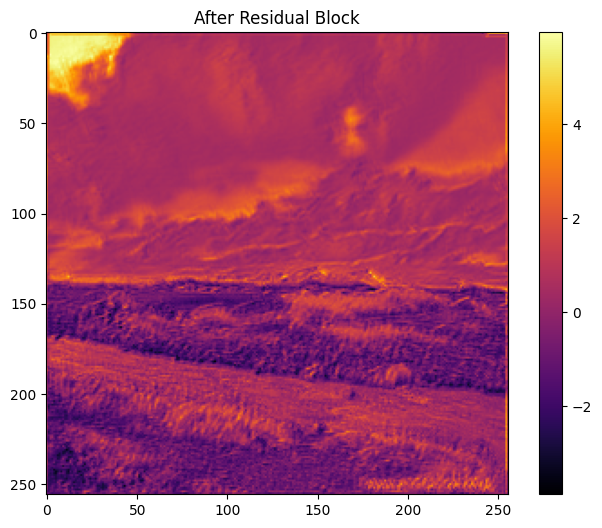

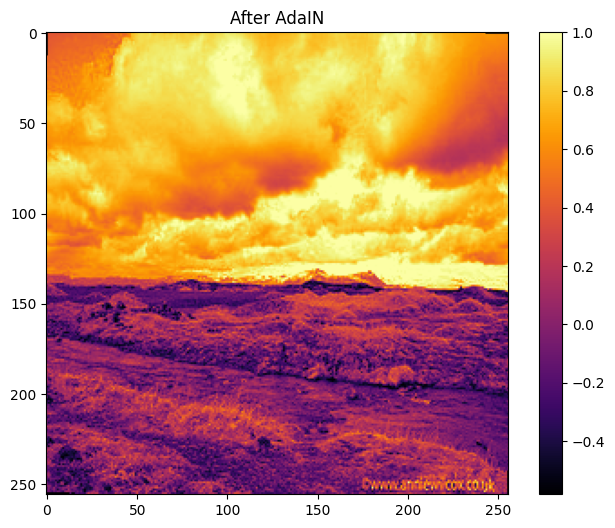

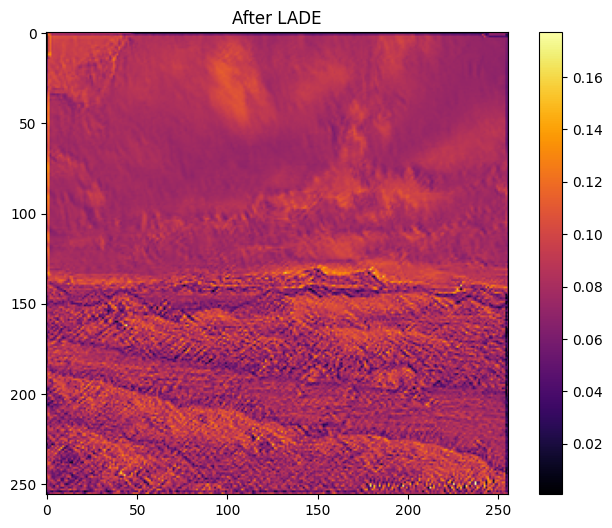

In [ ]:
def visualize_feature_map(tensor, title):
    """
    Visualizes the feature map by selecting one channel and displaying it as a heatmap.
    """
    tensor = tensor.squeeze(0).detach().cpu().numpy()  # Remove batch dim, move to CPU
    channel_idx = min(10, tensor.shape[0] - 1)  # Select a representative channel

    plt.figure(figsize=(8, 6))
    plt.imshow(tensor[channel_idx], cmap="inferno")
    plt.colorbar()
    plt.title(title)
    plt.show()

# Visualize the transformation effects
visualize_feature_map(dummy_input, "Original Feature Map")
visualize_feature_map(res_output, "After Residual Block")
visualize_feature_map(adain_output, "After AdaIN")
visualize_feature_map(lade_output, "After LADE")


In [ ]:
def get_mean_std(tensor):
    return tensor.mean().item(), tensor.std().item()

# Compute stats
original_mean, original_std = get_mean_std(dummy_input)
res_mean, res_std = get_mean_std(res_output)
adain_mean, adain_std = get_mean_std(adain_output)
lade_mean, lade_std = get_mean_std(lade_output)

# Print results
print(f"📊 Original: Mean={original_mean:.4f}, Std={original_std:.4f}")
print(f"🔹 Residual Block: Mean={res_mean:.4f}, Std={res_std:.4f}")
print(f"🔹 AdaIN: Mean={adain_mean:.4f}, Std={adain_std:.4f}")
print(f"🔹 LADE: Mean={lade_mean:.4f}, Std={lade_std:.4f}")


NameError: name 'dummy_input' is not defined

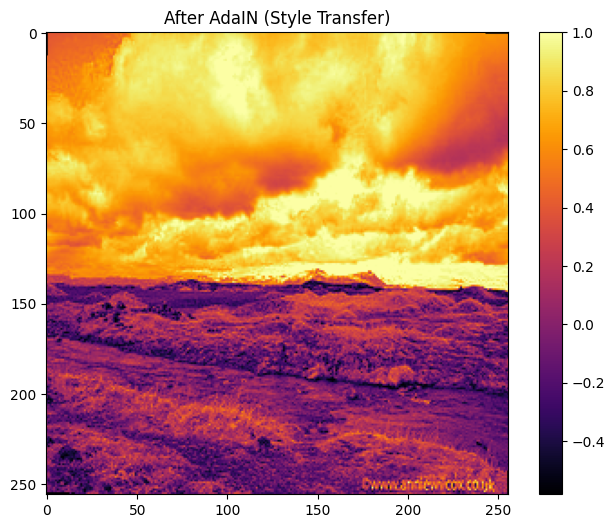

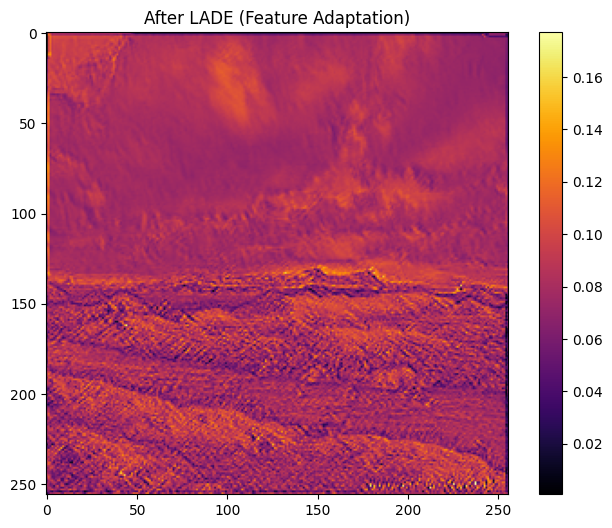

In [ ]:
visualize_feature_map(adain_output, "After AdaIN (Style Transfer)")
visualize_feature_map(lade_output, "After LADE (Feature Adaptation)")


In [ ]:
!pip install lpips

In [ ]:
import lpips
from torchvision import transforms

lpips_metric = lpips.LPIPS(net='vgg').to(device)

# Assuming lade_output has shape [1, 256, H, W] and you need [1, 3, H, W]
# Create a channel reduction layer to go from 256 to 3 channels
class ChannelReduction(nn.Module):
    def __init__(self, in_channels=256, out_channels=3):
        super(ChannelReduction, self).__init__()
        self.conv = nn.Conv2d(in_channels, out_channels, kernel_size=3, stride=1, padding=1)

    def forward(self, x):
        return self.conv(x)

# Initialize the reduction layer
channel_reduction = ChannelReduction().to(device)

# Reduce the channels of lade_output and adain_output to 3
lade_output_reduced = channel_reduction(lade_output)
adain_output_reduced = channel_reduction(adain_output)  # Reduce channels for adain_output as well

# Calculate LPIPS score using reduced channel outputs
lpips_score = lpips_metric(adain_output_reduced, lade_output_reduced)
print(f"LPIPS Score (Higher = More Different): {lpips_score.item():.4f}")


Setting up [LPIPS] perceptual loss: trunk [vgg], v[0.1], spatial [off]


/usr/local/lib/python3.11/dist-packages/torchvision/models/_utils.py:208: UserWarning: The parameter 'pretrained' is deprecated since 0.13 and may be removed in the future, please use 'weights' instead.
  warnings.warn(
/usr/local/lib/python3.11/dist-packages/torchvision/models/_utils.py:223: UserWarning: Arguments other than a weight enum or `None` for 'weights' are deprecated since 0.13 and may be removed in the future. The current behavior is equivalent to passing `weights=VGG16_Weights.IMAGENET1K_V1`. You can also use `weights=VGG16_Weights.DEFAULT` to get the most up-to-date weights.
  warnings.warn(msg)
Downloading: "https://download.pytorch.org/models/vgg16-397923af.pth" to /root/.cache/torch/hub/checkpoints/vgg16-397923af.pth
100%|██████████| 528M/528M [00:07<00:00, 74.3MB/s]


Loading model from: /usr/local/lib/python3.11/dist-packages/lpips/weights/v0.1/vgg.pth
LPIPS Score (Higher = More Different): 0.6854


In [ ]:
from torch.nn.functional import cosine_similarity

cos_sim_res = cosine_similarity(dummy_input.flatten(), res_output.flatten(), dim=0)
cos_sim_adain = cosine_similarity(dummy_input.flatten(), adain_output.flatten(), dim=0)
cos_sim_lade = cosine_similarity(dummy_input.flatten(), lade_output.flatten(), dim=0)

print(f"📏 Cosine Similarity - Residual Block: {cos_sim_res:.4f}")
print(f"📏 Cosine Similarity - AdaIN: {cos_sim_adain:.4f}")
print(f"📏 Cosine Similarity - LADE: {cos_sim_lade:.4f}")


📏 Cosine Similarity - Residual Block: 0.3690
📏 Cosine Similarity - AdaIN: 0.9991
📏 Cosine Similarity - LADE: -0.0415


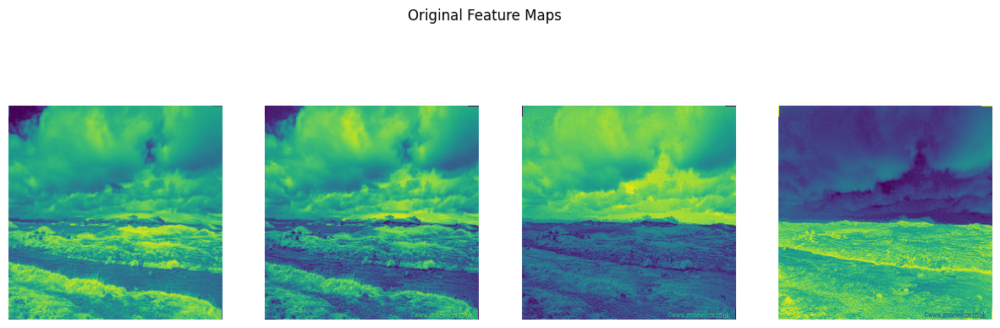

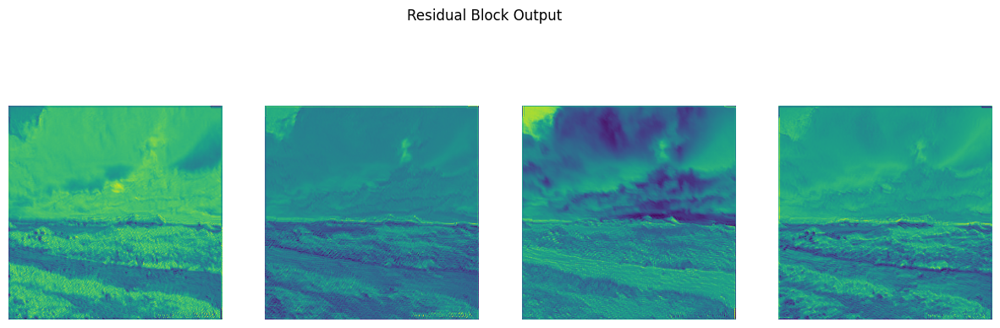

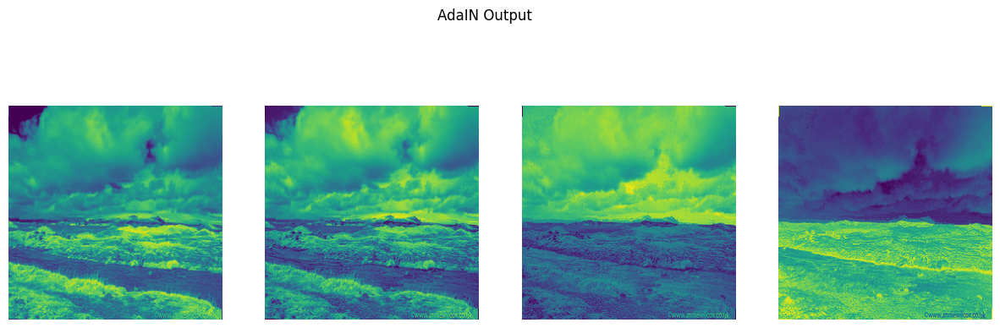

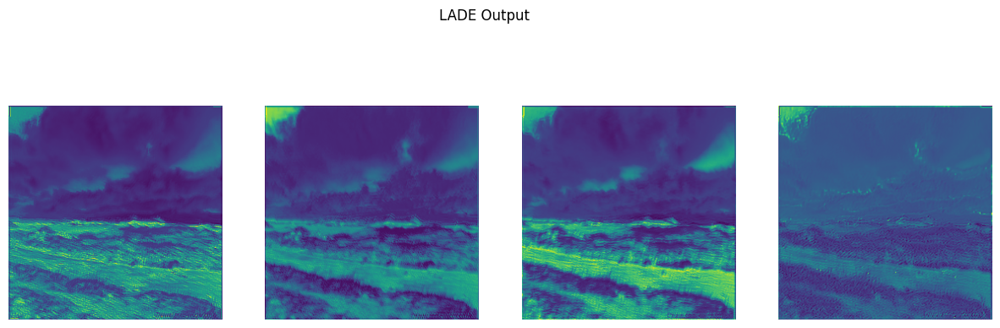

In [ ]:
import matplotlib.pyplot as plt

def show_feature_maps(tensor, title="Feature Maps", num_channels=4):
    fig, axes = plt.subplots(1, num_channels, figsize=(15, 5))
    for i in range(num_channels):
        axes[i].imshow(tensor[0, i].detach().cpu().numpy(), cmap='viridis')
        axes[i].axis("off")
    plt.suptitle(title)
    plt.show()

# Show before and after
show_feature_maps(dummy_input, "Original Feature Maps")
show_feature_maps(res_output, "Residual Block Output")
show_feature_maps(adain_output, "AdaIN Output")
show_feature_maps(lade_output, "LADE Output")


### Defining Generators and Discriminators

In [ ]:
# Define Generators and Discriminator
class GeneratorSupportTail(nn.Module):
    def __init__(self):
        super(GeneratorSupportTail, self).__init__()
        # Initial Convolutional Layers (downsampling)
        self.initial = nn.Sequential(
            nn.Conv2d(3, 64, kernel_size=4, stride=2, padding=1),
            nn.ReLU(inplace=True),
            nn.Conv2d(64, 128, kernel_size=4, stride=2, padding=1),
            nn.ReLU(inplace=True)
        )

        # Residual Blocks
        self.residual_blocks = nn.Sequential(
            ResidualBlock(128),
            ResidualBlock(128),
            ResidualBlock(128)
        )

        # Upsampling Layers
        self.upsample = nn.Sequential(
            nn.ConvTranspose2d(128, 64, kernel_size=4, stride=2, padding=1),
            nn.ReLU(inplace=True),
            nn.ConvTranspose2d(64, 32, kernel_size=4, stride=2, padding=1),
            nn.ReLU(inplace=True)
        )

        # Output Layer: Directly to 3 channels (RGB)
        self.output = nn.Sequential(
            nn.Conv2d(32, 3, kernel_size=7, stride=1, padding=3),
            nn.Tanh()
        )

    def forward(self, x):
        x = self.initial(x)
        x = self.residual_blocks(x)
        x = self.upsample(x)
        x = self.output(x)
        return x

channel_adjust = nn.Conv2d(512, 256, kernel_size=1).to(device)
class GeneratorMainTail(nn.Module):
    def __init__(self):
        super(GeneratorMainTail, self).__init__()
        self.adain = AdaIN()
        self.lade = LADE()

        # Initial Convolutional Block
        self.initial_block = nn.Sequential(
            nn.Conv2d(3, 64, kernel_size=7, stride=1, padding=3),
            nn.InstanceNorm2d(64),
            nn.ReLU(inplace=True)
        )

        # Downsampling Layers
        self.downsample = nn.Sequential(
            nn.Conv2d(64, 128, kernel_size=4, stride=2, padding=1),
            nn.InstanceNorm2d(128),
            nn.ReLU(inplace=True),
            nn.Conv2d(128, 256, kernel_size=4, stride=2, padding=1),
            nn.InstanceNorm2d(256),
            nn.ReLU(inplace=True)
        )

        # Residual Blocks
        self.residual_blocks = nn.Sequential(
            ResidualBlock(256),
            ResidualBlock(256),
            ResidualBlock(256),
            ResidualBlock(256)
        )

        # Refinement Block
        self.refinement_block = nn.Sequential(
            nn.Conv2d(256, 256, kernel_size=3, stride=1, padding=1),
            nn.InstanceNorm2d(256),
            nn.ReLU(inplace=True)
        )

        # Upsampling Layers
        self.upsample = nn.Sequential(
            nn.ConvTranspose2d(256, 128, kernel_size=4, stride=2, padding=1),
            nn.InstanceNorm2d(128),
            nn.ReLU(inplace=True),
            nn.ConvTranspose2d(128, 64, kernel_size=4, stride=2, padding=1),
            nn.InstanceNorm2d(64),
            nn.ReLU(inplace=True)
        )

        # Output Layer
        self.output_layer = nn.Sequential(
            nn.Conv2d(64, 3, kernel_size=7, stride=1, padding=3),
            nn.Tanh()
        )

    def forward(self, content_image, style_features):
        # Initial Convolution
        x = self.initial_block(content_image)

        # Downsample
        x = self.downsample(x)

        # Apply AdaIN for style transfer
        # x = self.adain(x, style_features)  # Use VGG features here

        # Pass through Residual Blocks
        x = self.residual_blocks(x)

        # Apply AdaIN again for consistency
        x = self.adain(x, style_features)

        # Refinement and upsampling
        x = self.lade(x)
        x = self.refinement_block(x)

        # Extract features from style_image using VGG19
        # style_features = get_features(style_image, vgg)  # Extract features here

        # Apply AdaIN for style transfer
        x = self.adain(x, style_features)  # Use VGG features here

        x = self.refinement_block(x)
        x = self.upsample(x)

        # Output layer to get RGB image
        stylized_image = self.output_layer(x)
        return stylized_image



class ResidualBlock(nn.Module):
    def __init__(self, channels):
        super(ResidualBlock, self).__init__()
        self.conv_block = nn.Sequential(
            nn.Conv2d(channels, channels, kernel_size=3, padding=1),
            nn.LeakyReLU(0.2, inplace=True),
            nn.Conv2d(channels, channels, kernel_size=3, padding=1),
            nn.LeakyReLU(0.2, inplace=True)
        )

    def forward(self, x):
        return x + self.conv_block(x)  # Skip connection

class Discriminator(nn.Module):
    def __init__(self):
        super(Discriminator, self).__init__()

        # Initial Convolutional Block with Spectral Normalization
        self.initial = nn.Sequential(
            nn.utils.spectral_norm(nn.Conv2d(3, 64, kernel_size=4, stride=2, padding=1)),
            nn.LeakyReLU(0.2, inplace=True)
        )

        # Downsampling Layers with increasing feature channels and spectral normalization
        self.downsample = nn.Sequential(
            nn.utils.spectral_norm(nn.Conv2d(64, 128, kernel_size=4, stride=2, padding=1)),
            nn.LeakyReLU(0.2, inplace=True),
            nn.utils.spectral_norm(nn.Conv2d(128, 256, kernel_size=4, stride=2, padding=1)),
            nn.LeakyReLU(0.2, inplace=True),
            nn.utils.spectral_norm(nn.Conv2d(256, 512, kernel_size=4, stride=2, padding=1)),
            nn.LeakyReLU(0.2, inplace=True)
        )

        # Fully Connected Layer to be set dynamically in forward pass
        self.final_conv = nn.utils.spectral_norm(nn.Conv2d(512, 1, kernel_size=4, stride=1, padding=1))

    def forward(self, x):
        x = self.initial(x)
        x = self.downsample(x)
        x = self.final_conv(x)
        # Apply AdaptiveAvgPool2d to reduce the output to a single value per image
        x = nn.AdaptiveAvgPool2d((1, 1))(x)
        return x.view(x.size(0), -1) # Reshape to [batch_size, 1]


# Assuming `num_batches` is the total number of batches in the dataloader
num_batches = len(real_world_loader)

class ChannelExpansion(nn.Module):
    def __init__(self, in_channels=3, out_channels=256):
        super(ChannelExpansion, self).__init__()
        self.conv = nn.Conv2d(in_channels, out_channels, kernel_size=3, stride=1, padding=1)

    def forward(self, x):
        return self.conv(x)

# Initialize the expansion layer
channel_expansion = ChannelExpansion().to(device)



# Define a channel reduction layer to go from 256 to 3 channels
class ChannelReduction(nn.Module):
    def __init__(self, in_channels=256, out_channels=3):
        super(ChannelReduction, self).__init__()
        self.conv = nn.Conv2d(in_channels, out_channels, kernel_size=3, stride=1, padding=1)


    def forward(self, x):
        return self.conv(x)

# Initialize the reduction layer
# channel_reduction = ChannelReduction().to(device)

In [ ]:
import torch

def compute_stats(tensor, name):
    mean = tensor.mean().item()
    std = tensor.std().item()
    print(f"📊 {name}: Mean={mean:.4f}, Std={std:.4f}")

# Generate a random input tensor
# dummy_input = torch.randn(1, 256, 64, 64).to(device)

# Pass through residual block
res_output = res_block(dummy_input)
compute_stats(res_output, "Residual Block Output")

# Pass through AdaIN (use the same input as style for testing)
adain_output = adain(res_output, res_output)
compute_stats(adain_output, "After AdaIN")

# Pass through LADE
lade_output = lade(adain_output)
compute_stats(lade_output, "After LADE")


📊 Residual Block Output: Mean=-0.0206, Std=1.0755
📊 After AdaIN: Mean=-0.0098, Std=0.7276
📊 After LADE: Mean=0.0667, Std=0.1118


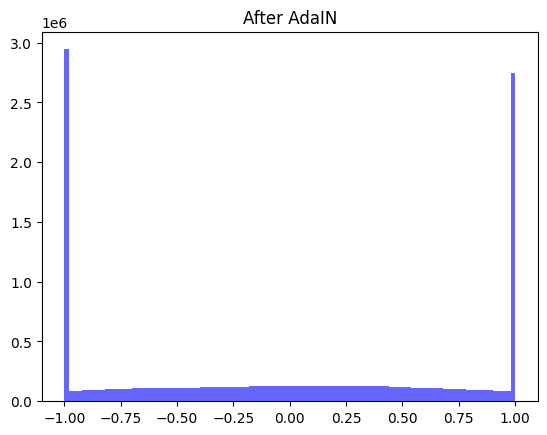

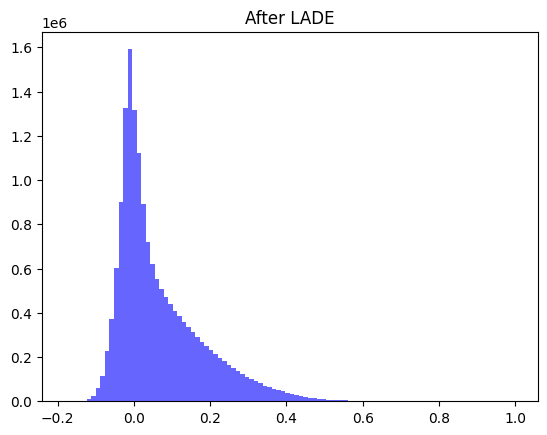

In [ ]:
import matplotlib.pyplot as plt

def plot_histogram(tensor, title):
    tensor = tensor.detach().cpu().numpy().flatten()
    plt.hist(tensor, bins=100, alpha=0.6, color='blue')
    plt.title(title)
    plt.show()

plot_histogram(adain_output, "After AdaIN")
plot_histogram(lade_output, "After LADE")


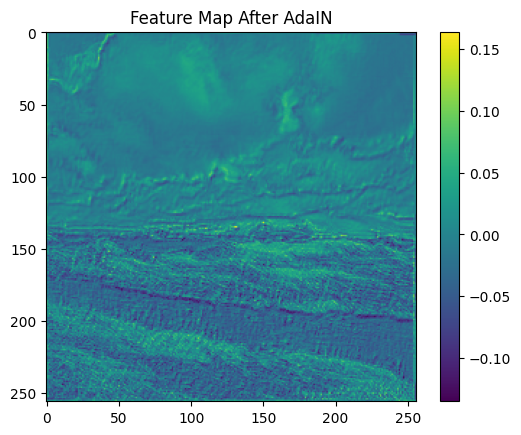

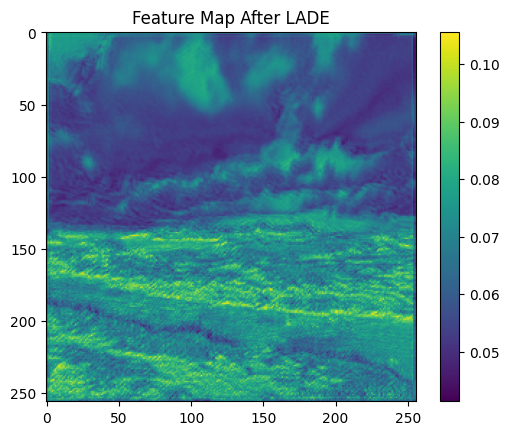

In [ ]:
import torchvision.transforms as transforms

def visualize_feature_map(tensor, title):
    img = tensor[0].detach().cpu().numpy().mean(axis=0)  # Convert to grayscale
    plt.imshow(img, cmap='viridis')
    plt.title(title)
    plt.colorbar()
    plt.show()

visualize_feature_map(adain_output, "Feature Map After AdaIN")
visualize_feature_map(lade_output, "Feature Map After LADE")


In [ ]:
# Get a batch of content and style images
content_images_batch = next(iter(real_world_loader))
style_images_batch = next(iter(anime_style_loader))

# Select first image from each batch
content_image = content_images_batch[0].unsqueeze(0).to(device)
style_image = style_images_batch[0].unsqueeze(0).to(device)

# Extract style features
style_features = get_features(style_image, vgg)

# Create an instance of the generator
generator = GeneratorMainTail().to(device)

# ========= FORWARD PASS MANUALLY =========
x = generator.initial_block(content_image)
x = generator.downsample(x)
x = generator.adain(x, style_features['conv3_1'])
x = generator.residual_blocks(x)

# Save output before LADE
x_without_lade = generator.refinement_block(x)
x_adain2 = generator.adain(x_without_lade, style_features['conv3_1'])  # Optional

# Final layers (without LADE)
x_final_without_lade = generator.refinement_block(x_adain2)
x_final_without_lade = generator.upsample(x_final_without_lade)
stylized_without_lade = generator.output_layer(x_final_without_lade)

# Now apply LADE and forward
x_with_lade = generator.lade(x)
x_with_lade = generator.refinement_block(x_with_lade)
x_with_lade = generator.adain(x_with_lade, style_features['conv3_1'])
x_with_lade = generator.refinement_block(x_with_lade)
x_with_lade = generator.upsample(x_with_lade)
stylized_with_lade = generator.output_layer(x_with_lade)


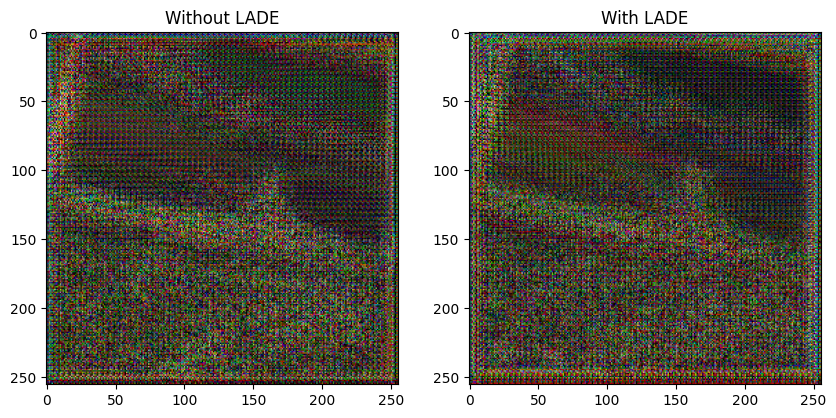

In [ ]:
# Convert tensor to image
def tensor_to_image(tensor):
    tensor = tensor.squeeze().detach().cpu().numpy().transpose(1, 2, 0)
    tensor = (tensor * 255).clip(0, 255).astype("uint8")
    return tensor

# Visualize
plt.figure(figsize=(10, 5))

plt.subplot(1, 2, 1)
plt.imshow(tensor_to_image(stylized_without_lade))
plt.title("Without LADE")

plt.subplot(1, 2, 2)
plt.imshow(tensor_to_image(stylized_with_lade))
plt.title("With LADE")

plt.show()


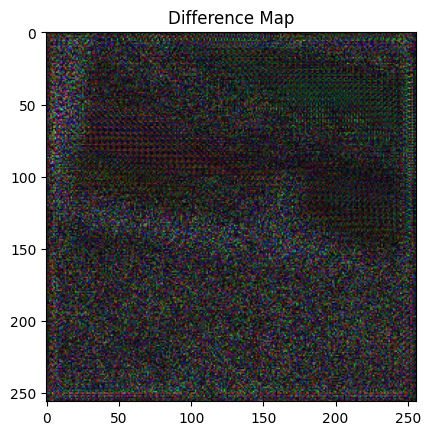

In [ ]:
diff = torch.abs(stylized_with_lade - stylized_without_lade)
plt.imshow(tensor_to_image(diff / diff.max()))  # Normalize difference for display
plt.title("Difference Map")
plt.show()


In [ ]:
import torch.nn.functional as F
from skimage.metrics import peak_signal_noise_ratio as psnr
from skimage.metrics import structural_similarity as ssim
import lpips  # pip install lpips

# Initialize LPIPS model
lpips_model = lpips.LPIPS(net='alex').to(device)

# 1. Normalize tensors to [0,1]
def normalize_tensor(t):
    return (t + 1) / 2.0  # From [-1,1] to [0,1]

img1 = normalize_tensor(stylized_without_lade).clamp(0, 1)
img2 = normalize_tensor(stylized_with_lade).clamp(0, 1)

# Resize to 3xHWC format for SSIM/PSNR
img1_np = img1.squeeze().permute(1, 2, 0).cpu().detach().numpy()
img2_np = img2.squeeze().permute(1, 2, 0).cpu().detach().numpy()

# 2. MSE (Mean Squared Error)
mse = F.mse_loss(img1, img2).item()

# 3. PSNR (Peak Signal-to-Noise Ratio)
psnr_value = psnr(img1_np, img2_np, data_range=1.0)

print("Image shape (HWC):", img1_np.shape)


# 4. SSIM (Structural Similarity Index)
ssim_value = ssim(
    img1_np, img2_np,
    win_size=5,  # Must be odd and ≤ smallest dimension
    data_range=1.0,
    channel_axis=2  # Use channel_axis instead of deprecated multichannel=True
)


# 5. LPIPS (Learned Perceptual Image Patch Similarity)
lpips_value = lpips_model(img1, img2).mean().item()

# Print results
print(f"🔍 LADE Impact Evaluation:")
print(f"  ✅ MSE  : {mse:.6f}")
print(f"  ✅ PSNR : {psnr_value:.2f} dB")
print(f"  ✅ SSIM : {ssim_value:.4f}")
print(f"  ✅ LPIPS: {lpips_value:.4f}")


Setting up [LPIPS] perceptual loss: trunk [alex], v[0.1], spatial [off]
Loading model from: /usr/local/lib/python3.11/dist-packages/lpips/weights/v0.1/alex.pth
Image shape (HWC): (256, 256, 3)
🔍 LADE Impact Evaluation:
  ✅ MSE  : 0.028051
  ✅ PSNR : 15.52 dB
  ✅ SSIM : 0.2755
  ✅ LPIPS: 0.1788


In [ ]:
class GeneratorMainTail(nn.Module):
    def __init__(self):
        super(GeneratorMainTail, self).__init__()
        self.adain = AdaIN()
        self.lade = LADE()

        self.initial_block = nn.Sequential(
            nn.Conv2d(3, 64, kernel_size=7, stride=1, padding=3),
            nn.InstanceNorm2d(64),
            nn.ReLU(inplace=True)
        )
        self.downsample = nn.Sequential(
            nn.Conv2d(64, 128, kernel_size=4, stride=2, padding=1),
            nn.InstanceNorm2d(128),
            nn.ReLU(inplace=True),
            nn.Conv2d(128, 256, kernel_size=4, stride=2, padding=1),
            nn.InstanceNorm2d(256),
            nn.ReLU(inplace=True)
        )
        self.residual_blocks = nn.Sequential(
            ResidualBlock(256),
            ResidualBlock(256),
            ResidualBlock(256),
            ResidualBlock(256)
        )
        self.refinement_block = nn.Sequential(
            nn.Conv2d(256, 256, kernel_size=3, stride=1, padding=1),
            nn.InstanceNorm2d(256),
            nn.ReLU(inplace=True)
        )
        self.upsample = nn.Sequential(
            nn.ConvTranspose2d(256, 128, kernel_size=4, stride=2, padding=1),
            nn.InstanceNorm2d(128),
            nn.ReLU(inplace=True),
            nn.ConvTranspose2d(128, 64, kernel_size=4, stride=2, padding=1),
            nn.InstanceNorm2d(64),
            nn.ReLU(inplace=True)
        )
        self.output_layer = nn.Sequential(
            nn.Conv2d(64, 3, kernel_size=7, stride=1, padding=3),
            nn.Tanh()
        )

    def encode(self, content_image, style_features):
        x = self.initial_block(content_image)
        x = self.downsample(x)
        x = self.residual_blocks(x)
        x = self.adain(x, style_features)
        x = self.refinement_block(x)
        return x  # 256-channel feature map

    def decode(self, x, style_features):
        x = self.adain(x, style_features)
        x = self.refinement_block(x)
        x = self.upsample(x)
        return self.output_layer(x)

    def forward(self, content_image, style_features):
        x = self.encode(content_image, style_features)
        x = self.lade(x)
        return self.decode(x, style_features)


Setting up [LPIPS] perceptual loss: trunk [alex], v[0.1], spatial [off]


/usr/local/lib/python3.11/dist-packages/torchvision/models/_utils.py:208: UserWarning: The parameter 'pretrained' is deprecated since 0.13 and may be removed in the future, please use 'weights' instead.
  warnings.warn(
/usr/local/lib/python3.11/dist-packages/torchvision/models/_utils.py:223: UserWarning: Arguments other than a weight enum or `None` for 'weights' are deprecated since 0.13 and may be removed in the future. The current behavior is equivalent to passing `weights=AlexNet_Weights.IMAGENET1K_V1`. You can also use `weights=AlexNet_Weights.DEFAULT` to get the most up-to-date weights.
  warnings.warn(msg)


Loading model from: /usr/local/lib/python3.11/dist-packages/lpips/weights/v0.1/alex.pth
🔬 LADE vs AdaIN-only Comparison:
  ✅ MSE  : 0.109957
  ✅ PSNR : 14.08 dB
  ✅ SSIM : 0.2126
  ✅ LPIPS: 0.1746


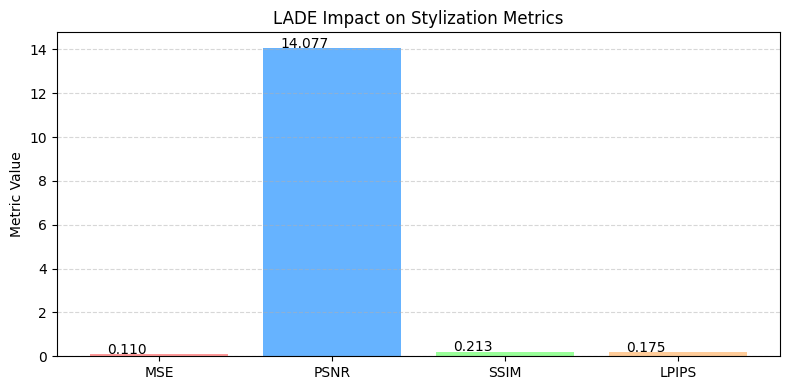

In [ ]:
import torch
import lpips
import numpy as np
import matplotlib.pyplot as plt
from skimage.metrics import structural_similarity as ssim
from skimage.metrics import peak_signal_noise_ratio as psnr
from torch.nn.functional import mse_loss

# ---- LPIPS Setup ----
lpips_model = lpips.LPIPS(net='alex').to(device)

# ---- Stylization: with vs. without LADE ----
# content_image, style_features already assumed to be loaded
GMT = GeneratorMainTail().to(device)
# Encode and apply AdaIN only
feature_map = GMT.encode(content_image, style_features['conv3_1'])

# 1. Output without LADE
img_without_lade = GMT.decode(feature_map, style_features['conv3_1'])

# 2. Apply LADE and then decode
lade_feature = GMT.lade(feature_map)
img_with_lade = GMT.decode(lade_feature, style_features['conv3_1'])

# Continue with metric evaluation

# ---- Preprocess for metrics ----
def to_np(img_tensor):
    img_np = img_tensor.squeeze().detach().permute(1, 2, 0).cpu().numpy()
    return np.clip(img_np, 0, 1)  # Ensure valid range

img1_np = to_np(img_without_lade)
img2_np = to_np(img_with_lade)

# ---- Metric Computation ----
mse_val   = mse_loss(img_without_lade, img_with_lade).item()
psnr_val  = psnr(img1_np, img2_np, data_range=1.0)
ssim_val  = ssim(img1_np, img2_np, win_size=11, channel_axis=2, data_range=1.0)
lpips_val = lpips_model(img_without_lade, img_with_lade).mean().item()

# ---- Print Results ----
print("🔬 LADE vs AdaIN-only Comparison:")
print(f"  ✅ MSE  : {mse_val:.6f}")
print(f"  ✅ PSNR : {psnr_val:.2f} dB")
print(f"  ✅ SSIM : {ssim_val:.4f}")
print(f"  ✅ LPIPS: {lpips_val:.4f}")

# ---- Plotting ----
metrics = ['MSE', 'PSNR', 'SSIM', 'LPIPS']
values = [mse_val, psnr_val, ssim_val, lpips_val]

plt.figure(figsize=(8, 4))
bars = plt.bar(metrics, values, color=['#FF9999','#66B3FF','#99FF99','#FFCC99'])
for bar in bars:
    yval = bar.get_height()
    plt.text(bar.get_x() + 0.1, yval + 0.01, f'{yval:.3f}', fontsize=10)
plt.title('LADE Impact on Stylization Metrics')
plt.ylabel('Metric Value')
plt.grid(axis='y', linestyle='--', alpha=0.5)
plt.tight_layout()
plt.show()


## Setting Training Parameters

In [ ]:
initial_content_weight = 10  # Adjusted for stability
initial_style_weight = 50  # Adjusted for balanced style transfer
decay_rate = 0.95  # Reduce weight per epoch

def get_weights(epoch):
    content_weight = initial_content_weight * (decay_rate ** epoch)
    style_weight = initial_style_weight * (decay_rate ** epoch)
    return content_weight, style_weight

# Training loop parameters
num_epochs = 50
batch_size = 8
accumulation_steps = 2

get_weights(num_epochs)

# Automatic device selection
# Set CUDA memory limit to 80% of available GPU RAM
device = torch.device("cuda" if torch.cuda.is_available() else "cpu")
if device.type == "cuda":
    print(f"Using device: {device}")
    torch.cuda.set_per_process_memory_fraction(0.8, torch.device("cuda:0"))


# Initialize models and optimizers
support_tail = GeneratorSupportTail().to(device)
# print(f"Support Tail to Device: {support_tail}")
main_tail = GeneratorMainTail().to(device)
# print(f"Main Tail to Device: {main_tail}")
discriminator = Discriminator().to(device)
# print(f"Discriminator to Device: {discriminator}")

optimizer_G = optim.Adam(
    list(support_tail.parameters()) + list(main_tail.parameters()),
    lr=0.0002, betas=(0.5, 0.999), weight_decay=1e-5
)

optimizer_D = optim.Adam(
    discriminator.parameters(),
    lr=0.0002, betas=(0.5, 0.999), weight_decay=1e-5
)

adversarial_loss = nn.BCEWithLogitsLoss()

# Mixed Precision
scaler = amp.GradScaler() if device.type == 'cuda' else None


# Define the checkpoint path
checkpoint_path = "model_checkpoint.pth"

# Check if Google Drive is mounted
if os.path.exists('/content/drive'):
    # If Drive is mounted, save checkpoint in the Drive path
    checkpoint_path = our_model_directory_path + 'model_checkpoint.pth'



# Function to save checkpoint
def save_checkpoint(epoch, batch_idx, support_tail, main_tail, discriminator, optimizer_G, optimizer_D, scaler, g_loss, d_loss, path=checkpoint_path):
    metadata = {
      'epoch': epoch,
      'batch_idx': batch_idx,
        'g_loss': g_loss if g_loss is not None else 0.0,  # Ensure non-None values
        'd_loss': d_loss if d_loss is not None else 0.0
      # 'hyperparameters': {'learning_rate': 0.0001, 'batch_size': 8}
  }
    torch.save({
        'support_tail_state_dict': support_tail.state_dict(),
        'main_tail_state_dict': main_tail.state_dict(),
        'discriminator_state_dict': discriminator.state_dict(),
        'optimizer_G_state_dict': optimizer_G.state_dict(),
        'optimizer_D_state_dict': optimizer_D.state_dict(),
        'scaler_state_dict': scaler.state_dict() if scaler else None,
        'metadata': metadata
    }, path, _use_new_zipfile_serialization=False)
    print(f"Checkpoint saved at epoch: {epoch} / batch: {batch_idx}")

# Function to load checkpoint
def load_checkpoint(support_tail, main_tail, discriminator, optimizer_G, optimizer_D, scaler, path=checkpoint_path):
    if os.path.exists(path):
        checkpoint = torch.load(path, map_location=device)
        support_tail.load_state_dict(checkpoint['support_tail_state_dict'])
        main_tail.load_state_dict(checkpoint['main_tail_state_dict'])
        discriminator.load_state_dict(checkpoint['discriminator_state_dict'])
        optimizer_G.load_state_dict(checkpoint['optimizer_G_state_dict'])
        optimizer_D.load_state_dict(checkpoint['optimizer_D_state_dict'])
        if scaler and checkpoint.get('scaler_state_dict') is not None:
            scaler.load_state_dict(checkpoint['scaler_state_dict'])

        metadata = checkpoint.get('metadata', {})
        start_epoch = metadata.get('epoch', 0)
        start_batch = metadata.get('batch_idx', 0)
        g_loss = metadata.get('g_loss', 0.0)
        d_loss = metadata.get('d_loss', 0.0)

        print(f"Checkpoint loaded from epoch {start_epoch}, batch {start_batch}")
        return start_epoch, start_batch, g_loss, d_loss
    else:
        print("No checkpoint found, starting from scratch")
        return 0, 0, 0.0, 0.0  # Start from epoch 0, batch 0 if no checkpoint exists



def get_next_style_batch(loader):
    global style_iter
    try:
        return next(style_iter)
    except StopIteration:
        style_iter = iter(loader)  # Reset iterator
        return next(style_iter)

style_iter = iter(anime_style_loader)

# Load checkpoint if exists
start_epoch, start_batch, last_g_loss, last_d_loss = load_checkpoint(support_tail, main_tail, discriminator, optimizer_G, optimizer_D, scaler)

# Initialize lists to store loss values
discriminator_losses = []
generator_losses = []

# Define the CSV file path
csv_file_path = our_model_directory_path + 'training_metrics.csv'

# Initialize CSV file with headers (if the file does not exist)
file_exists = os.path.exists(csv_file_path)
with open(csv_file_path, mode='a' if file_exists else 'w', newline='') as f:
    writer = csv.writer(f)
    if not file_exists:
        writer.writerow(['Epoch', 'Batch', 'D_Loss', 'Real_Mean', 'Real_Std', 'Fake_Mean', 'Fake_Std', 'D_Grad_Norm'])


Using device: cuda
Checkpoint loaded from epoch 0, batch 420


Train Model with loss functions

In [ ]:
import torch
import csv
import matplotlib.pyplot as plt
from tqdm import tqdm
from IPython.display import clear_output

# Enable optimized CUDA operations
torch.backends.cudnn.benchmark = True


# Optimize DataLoader for speed
real_world_loader = torch.utils.data.DataLoader(
    real_world_dataset, batch_size=batch_size, shuffle=True,
    num_workers=2, pin_memory=True, persistent_workers=True
)

anime_style_loader = torch.utils.data.DataLoader(
    anime_style_dataset, batch_size=batch_size, shuffle=True,
    num_workers=2, pin_memory=True, persistent_workers=True
)

torch.autograd.set_detect_anomaly(True)


for epoch in range(start_epoch, num_epochs):
    progress_bar = tqdm(enumerate(real_world_loader), total=len(real_world_loader), desc=f"Epoch {epoch+1}/{num_epochs}")

    for batch_idx, real_images in progress_bar:
        if epoch == start_epoch and batch_idx < start_batch:
            continue  # Skip completed batches if resuming

        # Get style_images and ensure batch size matches real_images
        try:
            style_images = next(style_iter)
        except StopIteration:
            style_iter = iter(anime_style_loader)
            style_images = next(style_iter)

        if style_images.size(0) != real_images.size(0):
            num_repeats = real_images.size(0) // style_images.size(0)
            style_images = style_images.repeat(num_repeats, 1, 1, 1)

        real_images, style_images = real_images.to(device, non_blocking=True), style_images.to(device, non_blocking=True)

        # ===========================
        # Train Discriminator
        # ===========================
        optimizer_D.zero_grad(set_to_none=True)  # Efficient memory handling
        real_labels = torch.ones(real_images.size(0), 1, device=device)
        fake_labels = torch.zeros(real_images.size(0), 1, device=device)

        with torch.amp.autocast("cuda"):
            real_output = discriminator(real_images).view(real_images.size(0), -1)
            d_real_loss = adversarial_loss(real_output, real_labels[:real_output.size(0)])

            # print(f"Real Images size: {real_images.shape}")
            rough_images = support_tail(real_images)

            # Extract style features using VGG19
            style_features = get_features(style_images, vgg, layers={'21': 'conv4_2'})['conv4_2']      # 256 channels
            style_features = channel_adjust(style_features)

            # style_features = nn.Conv2d(512, 256, kernel_size=1).to(device)(style_features)

            # print(f"Rough Images: {rough_images.shape} and Style Images: {style_images.shape}")
            refined_images = main_tail(rough_images, style_features)
            if torch.isnan(refined_images).any():
              print("⚠️ NaN detected in refined_images")

            fake_output = discriminator(refined_images.detach())

            if torch.isnan(real_output).any() or torch.isnan(fake_output).any():
              print("⚠️ NaN in discriminator output")



            d_fake_loss = adversarial_loss(fake_output, fake_labels[:fake_output.size(0)])

            d_loss = (d_real_loss + d_fake_loss) / 2

        if scaler:
            scaler.scale(d_loss).backward()
            scaler.step(optimizer_D)
            scaler.update()
        else:
            d_loss.backward()
            optimizer_D.step()

        # ===========================
        # Train Generator
        # ===========================
        optimizer_G.zero_grad(set_to_none=True)

        with torch.amp.autocast("cuda"):
            fake_output = discriminator(refined_images)
            g_adv_loss = adversarial_loss(fake_output, real_labels)

            # content_layer = "19"
            # g_content_loss = content_loss(real_images, style_images, layer=content_layer, weight=1.0)

            content_features_real = get_features(real_images, vgg)
            if torch.isnan(content_features_real['conv4_2']).any():
              print("⚠️ NaN in real content features")
            content_features_style = get_features(style_images, vgg)
            g_content_loss = content_loss(content_features_real, content_features_style, layer='conv4_2', weight=1.0)


            # ---  Calculate the style features  ---
            style_features_dict = get_features(style_images, vgg)  # Get style features as a dict
            if torch.isnan(style_features_dict['conv4_2']).any():
              print("⚠️ NaN in style features")

            generated_features_dict = get_features(refined_images, vgg) # Get generated features as a dict
            # g_style_loss = style_loss(real_images, refined_images)
            g_style_loss = style_loss(style_features_dict, generated_features_dict)

            g_loss = g_adv_loss + g_content_loss + g_style_loss
            if torch.isnan(g_adv_loss).any() or torch.isnan(g_content_loss).any() or torch.isnan(g_style_loss).any():
              print("⚠️ NaN in one of the generator losses")

        if scaler:
            torch.nn.utils.clip_grad_norm_(list(support_tail.parameters()) + list(main_tail.parameters()), max_norm=5.0)
            scaler.scale(g_loss).backward()
            scaler.step(optimizer_G)
            scaler.update()
        else:
            g_loss.backward()
            optimizer_G.step()

        # Update tqdm progress bar
        progress_bar.set_postfix({
            'D_Loss': f"{d_loss.item():.4f}",
            'G_Loss': f"{g_loss.item():.4f}",
            'G_Adv': f"{g_adv_loss.item():.4f}",
            'G_Content': f"{g_content_loss.item():.4f}",
            'G_Style': f"{g_style_loss.item():.4f}"
        })

        # Append loss values for visualization
        discriminator_losses.append(d_loss.item())
        generator_losses.append(g_loss.item())

        torch.autograd.set_detect_anomaly(True)

        # Save checkpoint
        if (batch_idx + 1) % 20 == 0:
            save_checkpoint(epoch, batch_idx+1, support_tail, main_tail, discriminator, optimizer_G, optimizer_D, scaler, g_loss, d_loss)

        # Clear memory to optimize GPU usage
        del real_images, style_images, rough_images, refined_images, fake_output, real_output, real_labels, fake_labels
        torch.cuda.empty_cache()

    start_batch = 0  # Reset batch index after each epoch

print("Training complete.")


## Quantitative Evaluation

In [ ]:
!ls

 adversarial_loss_data.xlsx   Anime_processed_data   model_checkpoint.pth	   vgg19_model.pth
'AI Anime Model.zip'	      dataset		     real_world_processed_images
 AnimeGANv3		      DTGAN-MODEL	     training_metrics.csv


In [ ]:
animeganv3path = "/content/drive/MyDrive/OUR_DTGAN_MODEL/"
os.chdir(animeganv3path)

In [ ]:
import tensorflow as tf
import numpy as np
import os
import cv2
import matplotlib.pyplot as plt
from tensorflow.keras.applications import VGG19, InceptionV3
from scipy.linalg import sqrtm
from scripts.model import Generator
from scripts.dataset import preprocess_image

# Load Model from Checkpoint
checkpoint_dir = "./training_checkpoints"
generator = Generator()
checkpoint = tf.train.Checkpoint(generator=generator)
latest_checkpoint = tf.train.latest_checkpoint(checkpoint_dir)

if latest_checkpoint:
    checkpoint.restore(latest_checkpoint)
    print(f"Loaded model from {latest_checkpoint}")
else:
    print("No checkpoint found! Ensure training is complete.")

# Hyperparameters
LATENT_DIM = 100
NUM_IMAGES = 10  # Number of images for testing
FID_BATCH_SIZE = 50

# Load Pretrained VGG19 for Perceptual Loss
vgg = VGG19(include_top=False, weights="imagenet", input_shape=(128, 128, 3))
vgg.trainable = False
feature_extractor = tf.keras.Model(inputs=vgg.input, outputs=vgg.get_layer("block5_conv4").output)  # Use block5 features

# Load Pretrained InceptionV3 for FID
inception = InceptionV3(include_top=False, pooling='avg', input_shape=(128, 128, 3))
inception.trainable = False

def generate_images(num_images=NUM_IMAGES):
    """Generate anime images from random noise."""
    noise = tf.random.normal([num_images, LATENT_DIM])
    generated_images = generator(noise, training=False)
    generated_images = (generated_images.numpy() + 1) / 2  # Rescale from (-1,1) to (0,1)
    return generated_images

def load_real_images(path, num_images=NUM_IMAGES):
    """Load real anime images for FID comparison."""
    images = []
    for filename in os.listdir(path)[:num_images]:
        img = cv2.imread(os.path.join(path, filename))
        img = cv2.resize(img, (128, 128))
        img = cv2.cvtColor(img, cv2.COLOR_BGR2RGB)
        img = (img / 127.5) - 1  # Normalize to (-1,1)
        images.append(img)
    return np.array(images)

def calculate_fid(real_images, generated_images):
    """Compute Fréchet Inception Distance (FID) using InceptionV3."""
    real_images = real_images.astype(np.float32)
    generated_images = generated_images.astype(np.float32)

    real_features = inception.predict(real_images, batch_size=FID_BATCH_SIZE)
    fake_features = inception.predict(generated_images, batch_size=FID_BATCH_SIZE)

    mu_real, sigma_real = real_features.mean(axis=0), np.cov(real_features, rowvar=False)
    mu_fake, sigma_fake = fake_features.mean(axis=0), np.cov(fake_features, rowvar=False)

    ssdiff = np.sum((mu_real - mu_fake) ** 2.0)

    covmean, _ = sqrtm(sigma_real @ sigma_fake, disp=False)
    if np.iscomplexobj(covmean):
        covmean = covmean.real

    return ssdiff + np.trace(sigma_real + sigma_fake - 2.0 * covmean)

def calculate_perceptual_loss(real_images, generated_images):
    """Compute Perceptual Loss (VGG Feature Similarity)"""
    real_features = feature_extractor.predict(real_images, batch_size=FID_BATCH_SIZE)
    fake_features = feature_extractor.predict(generated_images, batch_size=FID_BATCH_SIZE)
    return np.mean(np.abs(real_features - fake_features))

def save_images(real_images, generated_images, epoch=0):
    """Save Side-by-Side Comparisons"""
    num_images = len(real_images)
    fig, axes = plt.subplots(num_images, 2, figsize=(8, 4 * num_images))

    for i in range(num_images):
        axes[i, 0].imshow((real_images[i] + 1) / 2)  # Convert from (-1,1) to (0,1)
        axes[i, 0].set_title("Real Image")
        axes[i, 0].axis("off")

        axes[i, 1].imshow((generated_images[i] + 1) / 2)  # Convert from (-1,1) to (0,1)
        axes[i, 1].set_title("Generated Anime Image")
        axes[i, 1].axis("off")

    plt.tight_layout()
    os.makedirs("results", exist_ok=True)
    plt.savefig(f"results/image_comparison_epoch_{epoch}.png")
    print(f"📸 Image comparison saved as 'results/image_comparison_epoch_{epoch}.png'")

# Load Real Anime Images for Evaluation
real_images = load_real_images("data/anime_images", num_images=NUM_IMAGES)

# Generate Anime-Style Images
generated_images = generate_images(NUM_IMAGES)

# Compute Evaluation Metrics
fid_score = calculate_fid(real_images, generated_images)
perceptual_loss = calculate_perceptual_loss(real_images, generated_images)

# Save Image Comparisons
save_images(real_images, generated_images)

# Print Evaluation Results
print(f"FID Score: {fid_score:.2f} (Lower is better)")
print(f"Perceptual Loss: {perceptual_loss:.4f} (Lower is better)")

ModuleNotFoundError: No module named 'scripts.model'

In [ ]:
import torch
from torchvision.models import inception_v3
from scipy.linalg import sqrtm
import numpy as np

# Load InceptionV3 model for feature extraction
inception_model = inception_v3(init_weights=True, transform_input=False).to(device)
inception_model.eval()

# Helper function to get features from InceptionV3
def get_inception_features(images):
    with torch.no_grad():
        # Resize images to 299x299, required by InceptionV3
        images = torch.nn.functional.interpolate(images, size=(299, 299), mode='bilinear', align_corners=False)
        features = inception_model(images)
        return features.cpu().numpy()

# FID calculation function
def calculate_fid(real_features, fake_features):
    # Calculate mean and covariance of real and fake features
    mu_real, sigma_real = real_features.mean(axis=0), np.cov(real_features, rowvar=False)
    mu_fake, sigma_fake = fake_features.mean(axis=0), np.cov(fake_features, rowvar=False)

    # Calculate FID using the Fréchet Distance formula
    diff = mu_real - mu_fake
    cov_mean, _ = sqrtm(sigma_real.dot(sigma_fake), disp=False)
    if np.iscomplexobj(cov_mean):
        cov_mean = cov_mean.real
    fid_score = diff.dot(diff) + np.trace(sigma_real + sigma_fake - 2 * cov_mean)
    return fid_score

# Function to evaluate FID for generated images
def evaluate_fid(real_world_loader, anime_style_loader, num_batches=10):
    real_features, fake_features = [], []

    # Extract features for real images
    for i, real_images in enumerate(real_world_loader):
        if i >= num_batches: break
        real_images = real_images.to(device)
        real_features_batch = get_inception_features(real_images)
        real_features.append(real_features_batch)


    # Extract features for fake images
    # Get a single batch of style images to extract style features from
    style_images = next(iter(anime_style_loader)).to(device)
    style_features = get_features(style_images, vgg, layers={'19': 'conv4_1'})['conv4_1']      # 256 channels
    style_features = nn.Conv2d(512, 256, kernel_size=1).to(device)(style_features)

    # Extract features for fake images
    for i, real_images in enumerate(anime_style_loader):
        if i >= num_batches: break
        real_images = real_images.to(device)
        rough_images = support_tail(real_images)
        refined_images = main_tail(rough_images, style_features)
        fake_features_batch = get_inception_features(refined_images)
        fake_features.append(fake_features_batch)

    # Stack features and calculate FID
    real_features = np.concatenate(real_features, axis=0)
    fake_features = np.concatenate(fake_features, axis=0)
    fid_score = calculate_fid(real_features, fake_features)
    return fid_score

# Run FID evaluation
fid_score = evaluate_fid(anime_style_loader, real_world_loader)
print(f"FID Score: {fid_score}")



FID Score: 1.174611007569075e+25


Qualitative Evaluation

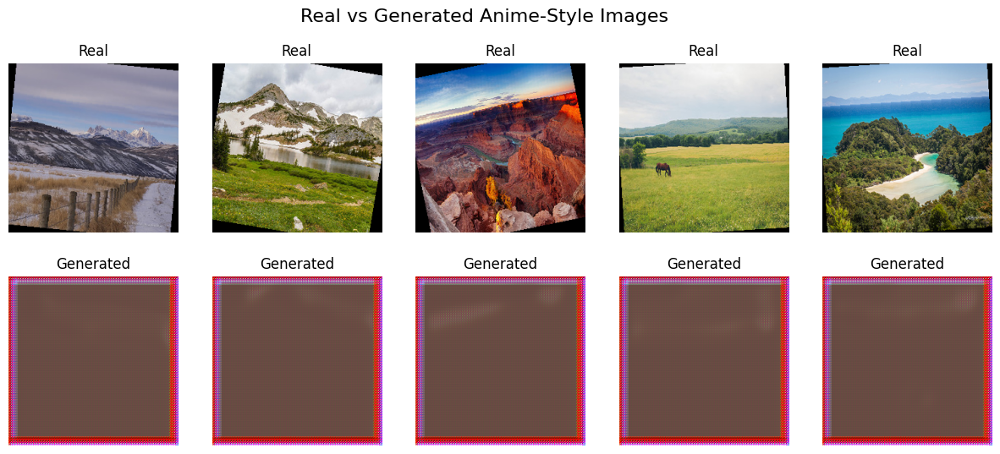

In [ ]:
import matplotlib.pyplot as plt


# Function to display real and generated images
def show_images(real_images, generated_images, title):
    fig, axes = plt.subplots(2, len(real_images), figsize=(15, 6))
    fig.suptitle(title, fontsize=16)

    for i in range(len(real_images)):
        # Display real images
        axes[0, i].imshow(real_images[i].permute(1, 2, 0).cpu().numpy() * 0.5 + 0.5)  # Unnormalize for display
        axes[0, i].axis('off')
        axes[0, i].set_title("Real")

        # Display generated images
        axes[1, i].imshow(generated_images[i].detach().permute(1, 2, 0).cpu().numpy() * 0.5 + 0.5)  # Unnormalize for display
        axes[1, i].axis('off')
        axes[1, i].set_title("Generated")

    plt.show()

# Display a few generated images with real images for comparison
def display_generated_images(num_images=5):
    real_images_batch = next(iter(real_world_loader))[:num_images].to(device)
    style_images_batch = next(iter(anime_style_loader))[:num_images].to(device)

    rough_images = support_tail(real_images_batch)
    # Extract style features instead of passing raw style images
    # Assume get_features and vgg are defined elsewhere
    style_features = get_features(style_images_batch, vgg, layers={'19': 'conv4_1'})['conv4_1']
    style_features = nn.Conv2d(512, 256, kernel_size=1).to(device)(style_features) # Adjust channels to 256 if needed

    generated_images = main_tail(rough_images, style_features)

    show_images(real_images_batch, generated_images, "Real vs Generated Anime-Style Images")

# Run qualitative evaluation
display_generated_images()


Inference and user-selected style control

In [ ]:
import torch
from PIL import Image
from torchvision import transforms
import matplotlib.pyplot as plt
from ipywidgets import FileUpload, Button, Label, VBox, HBox, Output
from io import BytesIO
from IPython.display import display

# Transformation for loading images
transform = transforms.Compose([
    transforms.Resize((256, 256)),                       # Resize to 256x256 pixels
    transforms.RandomHorizontalFlip(p=0.5),              # Random horizontal flip with 50% probability
    transforms.RandomRotation(15),                       # Random rotation by ±15 degrees
    transforms.RandomVerticalFlip(p=0.2),                # Random vertical flip with 20% probability
    transforms.ColorJitter(brightness=0.2,               # Random brightness adjustment
                           contrast=0.2,                 # Random contrast adjustment
                           saturation=0.2,               # Random saturation adjustment
                           hue=0.1),                     # Random hue adjustment
    transforms.RandomAffine(degrees=0,                   # Random affine transformation with translation
                            translate=(0.1, 0.1),        # Up to 10% translation in both x and y directions
                            scale=(0.9, 1.1),            # Random scaling between 90% and 110%
                            shear=10),                   # Random shear up to 10 degrees
    transforms.RandomPerspective(distortion_scale=0.5,   # Random perspective distortion
                                 p=0.5,                  # Apply with 50% probability
                                 interpolation=3),       # Use bicubic interpolation
    transforms.ToTensor(),                               # Convert to tensor
    transforms.Normalize(mean=(0.5, 0.5, 0.5), std=(0.5, 0.5, 0.5))  # Normalize to [-1, 1]
])

# Function to load and preprocess an image
def load_image(image_data, transform):
    image = Image.open(BytesIO(image_data)).convert("RGB")
    return transform(image).unsqueeze(0)  # Add batch dimension

# Function to denormalize and display an image
def show_image(tensor_image):
    image = tensor_image.squeeze(0).cpu().detach()  # Remove batch dimension
    image = image * 0.5 + 0.5  # Denormalize to [0, 1]
    image = transforms.ToPILImage()(image)
    plt.imshow(image)
    plt.axis("off")
    plt.show()

# Function for style transfer
def stylize_image(content_image_data, style_image_data, support_tail, main_tail, device):
    # Load content and style images
    content_image = load_image(content_image_data, transform).to(device)
    style_image = load_image(style_image_data, transform).to(device)

    style_features = get_features(style_image, vgg, layers={'19': 'conv4_1'})['conv4_1']
    style_features = nn.Conv2d(512, 256, kernel_size=1).to(device)(style_features) # Adjust channels to 256 if needed

    # Support Tail: Initial rough style application
    with torch.no_grad():
        rough_image = support_tail(content_image)

    # Main Tail: Refined style application with user-selected style
    with torch.no_grad():
        stylized_image = main_tail(rough_image, style_features)

    # Display the result
    show_image(stylized_image)

# Model setup (assuming support_tail and main_tail models are already loaded and in evaluation mode)
device = torch.device("cuda" if torch.cuda.is_available() else "cpu")
support_tail.to(device).eval()
main_tail.to(device).eval()

# Widgets for image uploading, confirmation, and style transfer
content_upload = FileUpload(accept='image/*', multiple=False, description="Upload Content Image")
style_upload = FileUpload(accept='image/*', multiple=False, description="Upload Style Image")
display_button = Button(description="Display Styled Output", button_style="success")
status_label = Label(value="Please upload both content and style images.")
output = Output()

# Display widgets in layout
display(VBox([
    HBox([content_upload, style_upload]),
    status_label,
    display_button,
    output
]))

# Global variables for storing uploaded images
content_image_data = None
style_image_data = None

# Function to handle content image upload
def on_content_upload(change):
    global content_image_data
    content_image_data = list(content_upload.value.values())[0]['content']
    status_label.value = "Content image uploaded successfully!"

# Function to handle style image upload
def on_style_upload(change):
    global style_image_data
    style_image_data = list(style_upload.value.values())[0]['content']
    status_label.value = "Style image uploaded successfully!"

# Function to enable the display button after both images are uploaded
def enable_display_button():
    if content_image_data and style_image_data:
        status_label.value = "Both images uploaded! Click 'Display Styled Output' to see results."
        display_button.disabled = False
    else:
        display_button.disabled = True

# Function to display the styled output on button click
def on_display_button_click(b):
    with output:
        output.clear_output()  # Clear previous outputs
        if content_image_data and style_image_data:
            status_label.value = "Applying style transfer..."
            stylize_image(content_image_data, style_image_data, support_tail, main_tail, device)
            status_label.value = "Style transfer complete! See the output above."
        else:
            status_label.value = "Error: Please upload both content and style images."

# Observe file uploads and enable the display button
content_upload.observe(on_content_upload, names='value')
style_upload.observe(on_style_upload, names='value')
content_upload.observe(lambda change: enable_display_button(), names='value')
style_upload.observe(lambda change: enable_display_button(), names='value')

# Attach button click event
display_button.on_click(on_display_button_click)
display_button.disabled = True  # Initially disable the display button


In [ ]:
!pip install torchmetrics

In [ ]:
!pip install lpips

In [ ]:

import torch
import torchvision
import torch.nn.functional as F
import torchvision.transforms as transforms
from torchvision.models import inception_v3, vgg16
from torchmetrics.image.fid import FrechetInceptionDistance
from torchmetrics.image.inception import InceptionScore
from torchmetrics.functional.image import structural_similarity_index_measure as SSIM
from torchmetrics.functional.image import peak_signal_noise_ratio as PSNR
import lpips  # Perceptual loss (LPIPS)
import numpy as np
from scipy.linalg import sqrtm
from PIL import Image
import os


In [ ]:
!pip install torchmetrics[image]

In [ ]:
!pip install torchmetrics[image] torch-fidelity

In [ ]:
!pip install torch-fidelity

In [ ]:
import torch_fidelity
import torchmetrics

In [ ]:
num_images=5
real_images_batch = next(iter(real_world_loader))[:num_images].to(device)
style_images_batch = next(iter(anime_style_loader))[:num_images].to(device)

rough_images = support_tail(real_images_batch)
# Extract style features instead of passing raw style images
# Assume get_features and vgg are defined elsewhere
style_features = get_features(style_images_batch, vgg, layers={'19': 'conv4_1'})['conv4_1']
style_features = nn.Conv2d(512, 256, kernel_size=1).to(device)(style_features) # Adjust channels to 256 if needed

generated_images1 = main_tail(rough_images, style_features)

In [ ]:
# Initialize FID metric
fid_metric = FrechetInceptionDistance(feature=64, normalize=True).to(device)  # Uses InceptionV3 features

# Function to compute FID
def compute_fid(real_images, generated_images):
    """
    Compute the Fréchet Inception Distance (FID) between real and generated images.
    """
    real_images = torch.cat([real_images], dim=0)  # Stack all real images
    generated_images = torch.cat([generated_images], dim=0)  # Stack all generated images

    real_images = real_images.to(device)  # Move to device if not already there
    generated_images = generated_images.to(device)

    fid_metric.update(real_images, real=True)
    fid_metric.update(generated_images, real=False)
    fid_score = fid_metric.compute()
    print(f"FID Score: {fid_score.item()}")
    return fid_score.item()


fid_score = compute_fid(real_images, generated_images)


FID Score: 98.74673461914062


In [ ]:
real_images = torch.cat([real_images], dim=0)  # Stack all real images
generated_images = torch.cat([generated_images], dim=0)  # Stack all generated images

real_images = real_images.to(device)  # Move to device if not already there
generated_images = generated_images.to(device)


In [ ]:
!pip install --upgrade certifi

import ssl
import lpips

# Create a new SSL context with updated certificates
ssl._create_default_https_context = ssl._create_unverified_context

# Now load the LPIPS model
lpips_model = lpips.LPIPS(net='vgg').cuda()

Setting up [LPIPS] perceptual loss: trunk [vgg], v[0.1], spatial [off]


/usr/local/lib/python3.11/dist-packages/torchvision/models/_utils.py:208: UserWarning: The parameter 'pretrained' is deprecated since 0.13 and may be removed in the future, please use 'weights' instead.
  warnings.warn(
/usr/local/lib/python3.11/dist-packages/torchvision/models/_utils.py:223: UserWarning: Arguments other than a weight enum or `None` for 'weights' are deprecated since 0.13 and may be removed in the future. The current behavior is equivalent to passing `weights=VGG16_Weights.IMAGENET1K_V1`. You can also use `weights=VGG16_Weights.DEFAULT` to get the most up-to-date weights.
  warnings.warn(msg)
Downloading: "https://download.pytorch.org/models/vgg16-397923af.pth" to /root/.cache/torch/hub/checkpoints/vgg16-397923af.pth
100%|██████████| 528M/528M [00:07<00:00, 69.4MB/s]


Loading model from: /usr/local/lib/python3.11/dist-packages/lpips/weights/v0.1/vgg.pth


In [ ]:
# Load LPIPS model
lpips_model = lpips.LPIPS(net='vgg').cuda()  # Use 'alex' for AlexNet-based model

def compute_lpips(image1, image2):
    """
    Compute LPIPS perceptual similarity between two images.
    Lower LPIPS = More perceptually similar images.
    """
    image1, image2 = image1.cuda(), image2.cuda()
    lpips_score = lpips_model(image1, image2)
    print(f"LPIPS: {lpips_score.item()}")
    return lpips_score.item()

# Example usage
generated_image = generated_images[0]  # Select the first generated image
real_image = real_images[0]
lpips_score = compute_lpips(real_image, generated_image)


Setting up [LPIPS] perceptual loss: trunk [vgg], v[0.1], spatial [off]


/usr/local/lib/python3.11/dist-packages/torchvision/models/_utils.py:208: UserWarning: The parameter 'pretrained' is deprecated since 0.13 and may be removed in the future, please use 'weights' instead.
  warnings.warn(
/usr/local/lib/python3.11/dist-packages/torchvision/models/_utils.py:223: UserWarning: Arguments other than a weight enum or `None` for 'weights' are deprecated since 0.13 and may be removed in the future. The current behavior is equivalent to passing `weights=VGG16_Weights.IMAGENET1K_V1`. You can also use `weights=VGG16_Weights.DEFAULT` to get the most up-to-date weights.
  warnings.warn(msg)


Loading model from: /usr/local/lib/python3.11/dist-packages/lpips/weights/v0.1/vgg.pth
LPIPS: 0.89202481508255


In [ ]:
def compute_ssim(image1, image2):
    """
    Compute SSIM between two images.
    Higher SSIM = Better structure preservation.
    """
    # Add a batch dimension to the images
    image1 = image1.unsqueeze(0)
    image2 = image2.unsqueeze(0)
    return SSIM(image1, image2).item()

# Example usage
generated_image = generated_images[0]  # Select the first generated image
real_image = real_images[0]
ssim_score = compute_ssim(real_image, generated_image)
print(f"SSIM Score: {ssim_score}")

SSIM Score: -0.016935620456933975


In [ ]:
def compute_psnr(image1, image2):
    """
    Compute PSNR between two images.
    Higher PSNR = Less noise and higher quality.
    """
    # Add a batch dimension to the images
    image1 = image1.unsqueeze(0)
    image2 = image2.unsqueeze(0)
    return PSNR(image1, image2).item()

# Example usage
psnr_score = compute_psnr(real_image, generated_image)
print(f"PSNR: {psnr_score}")

PSNR: 8.648366928100586


In [ ]:
# Load InceptionV3 model for Inception Score calculation
inception_score_metric = InceptionScore(feature=2048, normalize=True).to(device)  # Uses 2048 feature dimensions

def compute_inception_score(generated_images):
    """
    Compute Inception Score (IS) for generated images.
    Higher IS = More diverse and realistic images.
    """
    # generated_images = torch.cat(generated_images, dim=0)  # Stack generated images
    inception_score_metric.update(generated_images)
    is_mean, is_std = inception_score_metric.compute()
    return is_mean.item(), is_std.item()

# Example usage
real_images = torch.cat([real_images], dim=0)  # Stack all real images
generated_images = torch.cat([generated_images], dim=0)  # Stack all generated images

real_images = real_images.to(device)  # Move to device if not already there
generated_images = generated_images.to(device)

generated_image = generated_images[0]  # Select the first generated image
real_image = real_images[0]

is_score, is_std = compute_inception_score(generated_images)
print(f"Inception Score (IS): {is_score} ± {is_std}")


/usr/local/lib/python3.11/dist-packages/torchmetrics/utilities/prints.py:43: UserWarning: Metric `InceptionScore` will save all extracted features in buffer. For large datasets this may lead to large memory footprint.
  warnings.warn(*args, **kwargs)


Inception Score (IS): 1.0000001192092896 ± 1.5157247901242954e-07


In [ ]:
def evaluate_images(real_dir, generated_dir):
    """
    Evaluates real and generated images using multiple quantitative metrics.
    """
    real_images, generated_images = [], []
    lpips_scores, ssim_scores, psnr_scores = [], [], []

    for img_name in os.listdir(real_dir):
        real_img_path = os.path.join(real_dir, img_name)
        gen_img_path = os.path.join(generated_dir, img_name)

        if os.path.exists(gen_img_path):  # Ensure corresponding generated image exists
            real_img = load_image(real_img_path).cuda()
            gen_img = load_image(gen_img_path).cuda()

            # Store images for FID & IS
            real_images.append(real_img)
            generated_images.append(gen_img)

            # Compute LPIPS, SSIM, and PSNR
            lpips_scores.append(compute_lpips(real_img, gen_img))
            ssim_scores.append(compute_ssim(real_img, gen_img))
            psnr_scores.append(compute_psnr(real_img, gen_img))

    # Compute FID & IS
    fid_score = compute_fid(real_images, generated_images)
    is_mean, is_std = compute_inception_score(generated_images)

    # Print results
    print("Evaluation Results:")
    print(f"FID Score: {fid_score:.4f}")
    print(f"LPIPS Score (Perceptual Similarity): {np.mean(lpips_scores):.4f}")
    print(f"SSIM Score (Structural Fidelity): {np.mean(ssim_scores):.4f}")
    print(f"PSNR Score (Noise Level): {np.mean(psnr_scores):.2f} dB")
    print(f"Inception Score (IS): {is_mean:.4f} ± {is_std:.4f}")

    return {
        "FID": fid_score,
        "LPIPS": np.mean(lpips_scores),
        "SSIM": np.mean(ssim_scores),
        "PSNR": np.mean(psnr_scores),
        "IS": (is_mean, is_std)
    }

# Example usage
results = evaluate_images(real_images, generated_images)


TypeError: only integer tensors of a single element can be converted to an index